# Vizualization jupyter for create all plots
- heat map:
    * single heatmap
    * all subsets inone plot
    * heatmap for base subset but with different split and scaffolds
    * hetmap showing comparison between base and other subsets
    * heatmap showing values difference between baseline and other subsets
- radar plots
- trends plot
- t-SNE
- overlaps


In [1]:
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.metrics import jaccard_score
from matplotlib.colors import ListedColormap

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Draw

#from scripts import visualization
import importlib as imp

# Import knihoven
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import time
#imp.reload(visualization)

In [136]:
from scripts import heatmap_visualization as hv
import importlib as imp
imp.reload(hv)

import pandas as pd

# HEATMAPS

### Heatmap of single split

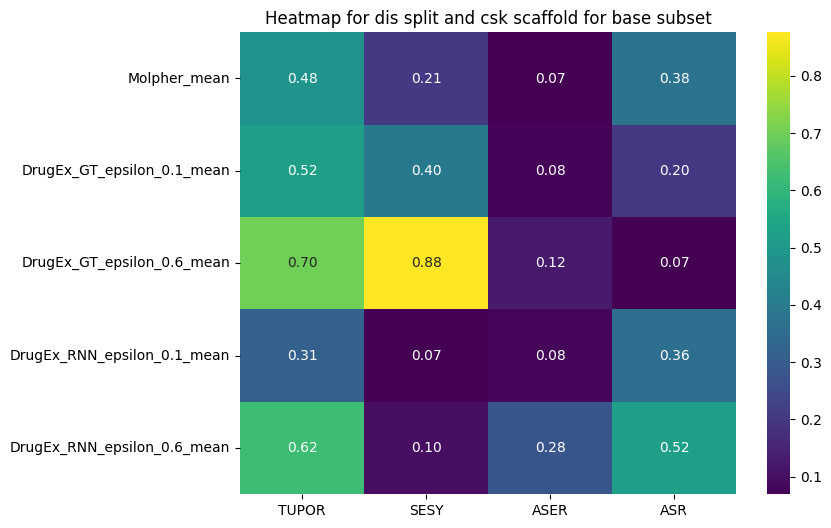

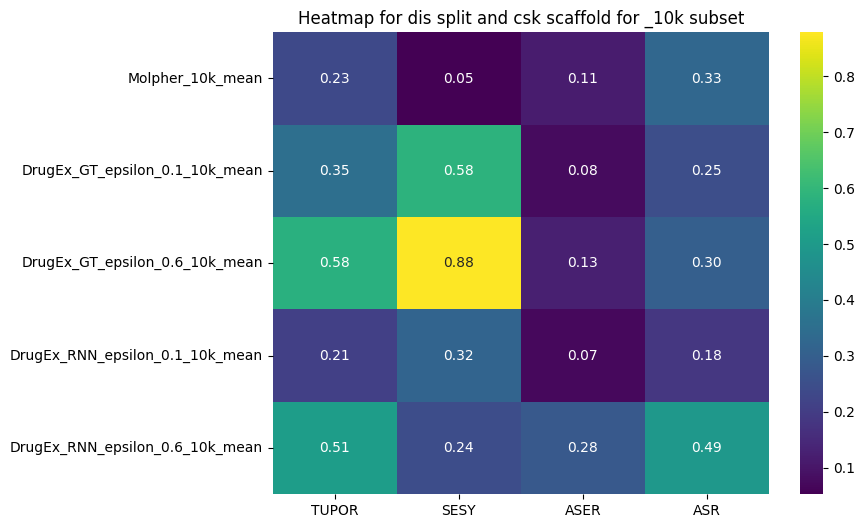

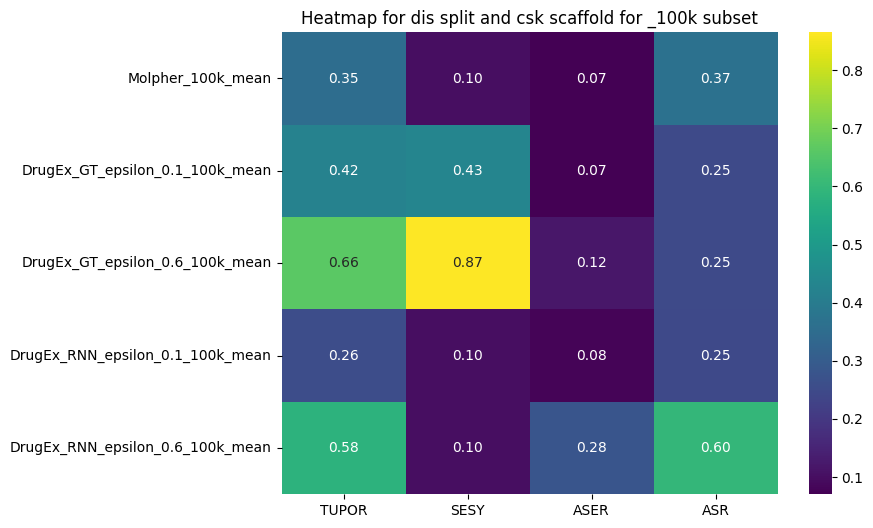

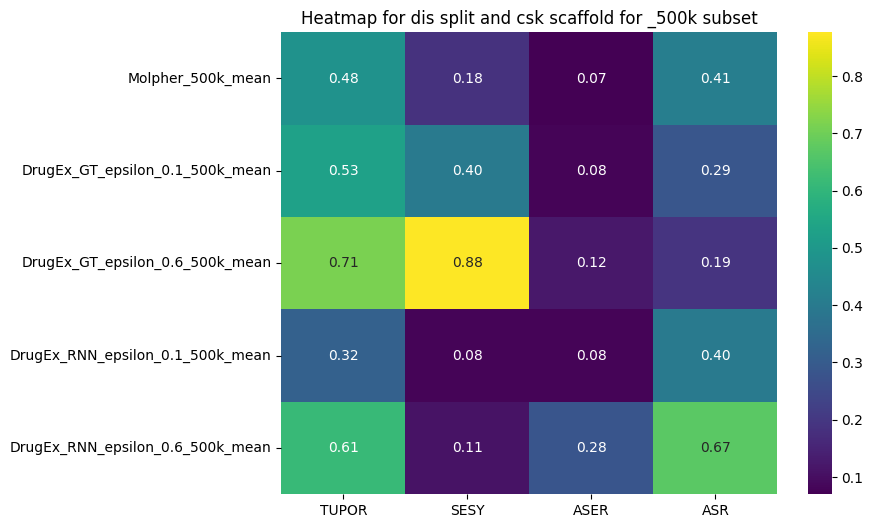

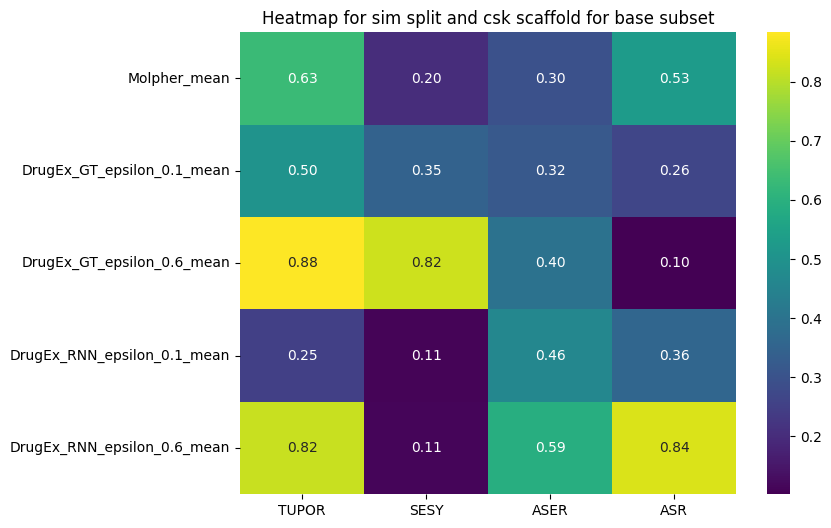

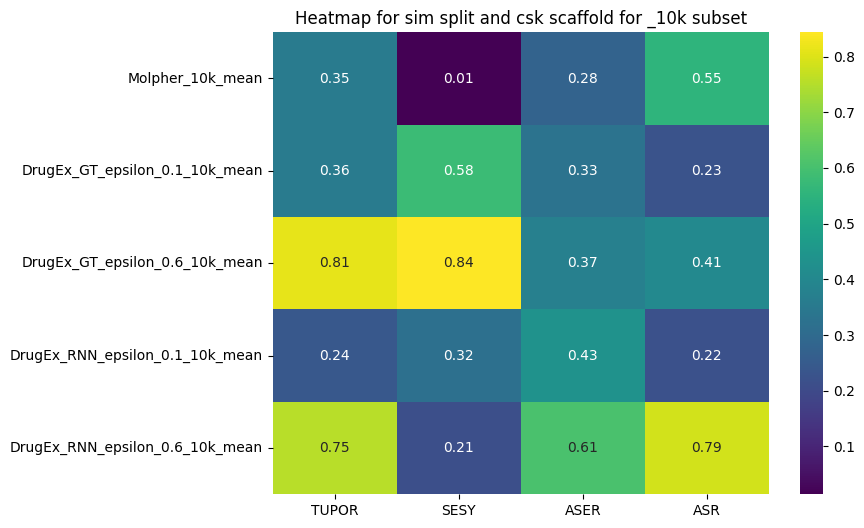

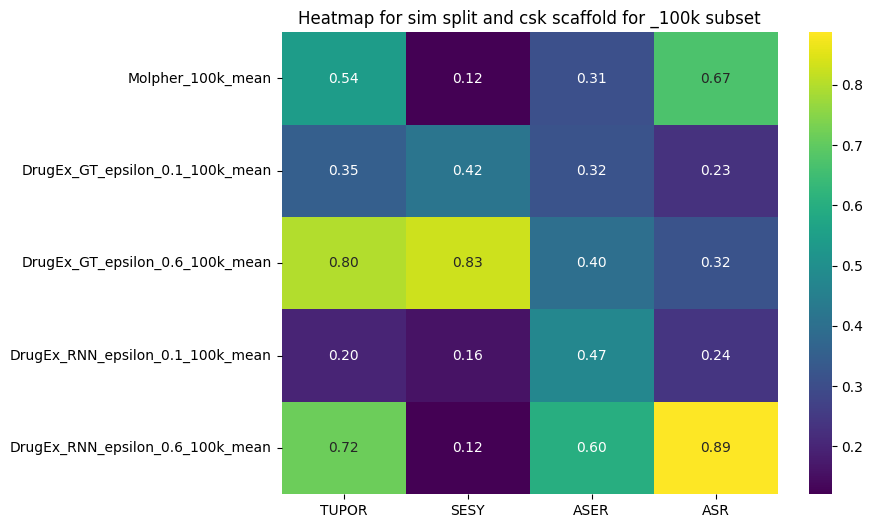

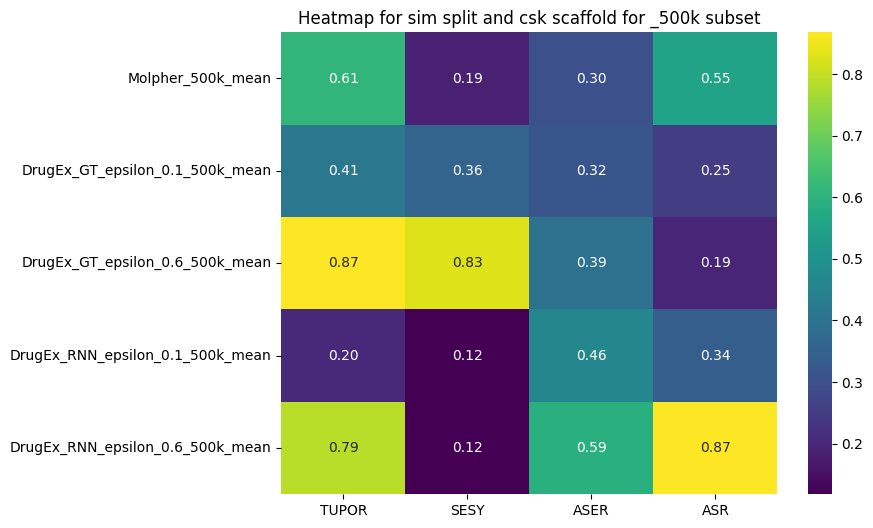

In [142]:
# Iterate over different types of splits (e.g., 'dis' and 'sim')
for type_split in ['dis', 'sim']:
    # Iterate over different scaffold types (e.g., 'csk' and 'murcko')
    for scaf in ['csk']:
        # Iterate over the subsets (in this case, an empty subset to represent the base) (e.g. '_10k', '_100k', '_500k', '')
        for subset in ['', '_10k', '_100k', '_500k']:
            # Load the data for the current subset from the corresponding CSV file
            df = pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}{subset}_norm_min_max.csv")
            
            # If the subset is empty, label it as 'base' (representing the baseline subset)
            if subset == '':
                subset = 'base'
            
            # Call the plot_heatmap function to generate and display the heatmap for the loaded data
            # The title dynamically reflects the split type, scaffold, and subset name
            hv.plot_heatmap(df, title=f"Heatmap for {type_split} split and {scaf} scaffold for {subset} subset")


### Heatmap of different subsets visualized in a single plot.

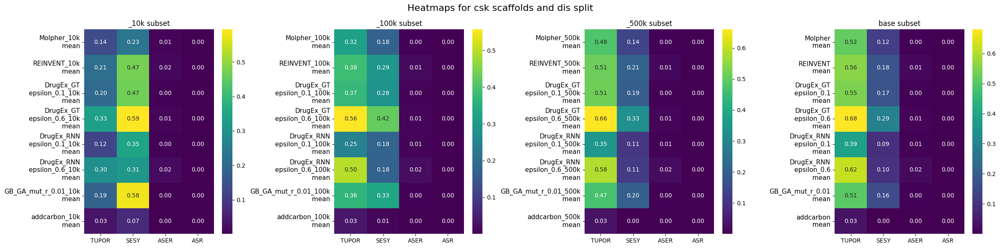

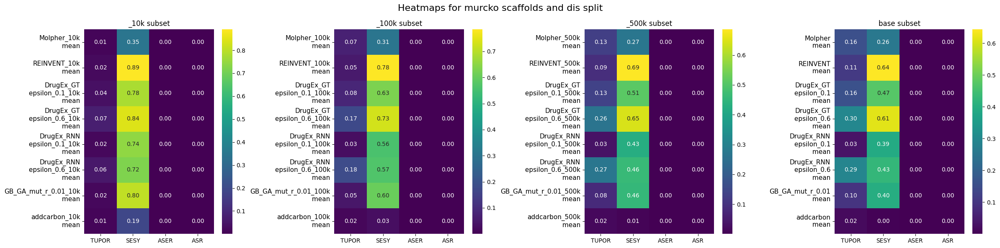

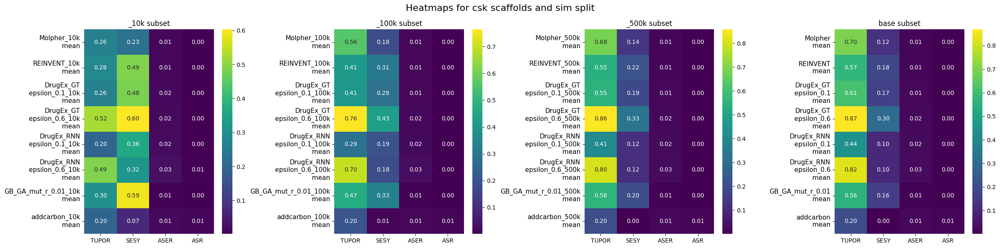

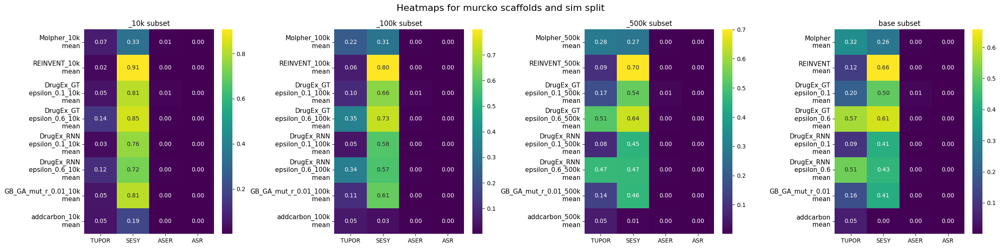

In [141]:
# Iterate through different types of splits (e.g., 'dis' and 'sim') and scaffold types (e.g., 'csk' and 'murcko')
for type_split in ['dis', 'sim']:
    for scaf in ['csk', 'murcko']:
        # Initialize an empty dictionary to store the data for each subset
        subset_dict = {}

        # Iterate through different subsets (base, 1k, 10k, 100k, 500k)
        for k, subset in enumerate(['_10k', '_100k', '_500k', '']):
            # Load the corresponding DataFrame from the CSV file based on the subset
            df = pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}{subset}.csv")
            
            # Add the loaded data to the subset_dict with the subset name as the key
            subset_dict[subset] = df
        
        # Call the plot_all_subsets function to plot heatmaps for all subsets in the subset_dict
        # The title for the heatmap figure is dynamically generated based on the scaffold type and split type
        hv.plot_all_subsets(subset_dict, title=f'Heatmaps for {scaf} scaffolds and {type_split} split')


### Visualizing Heatmaps of Different Subsets for Various Split Types and Scaffold Combinations fro Base subset


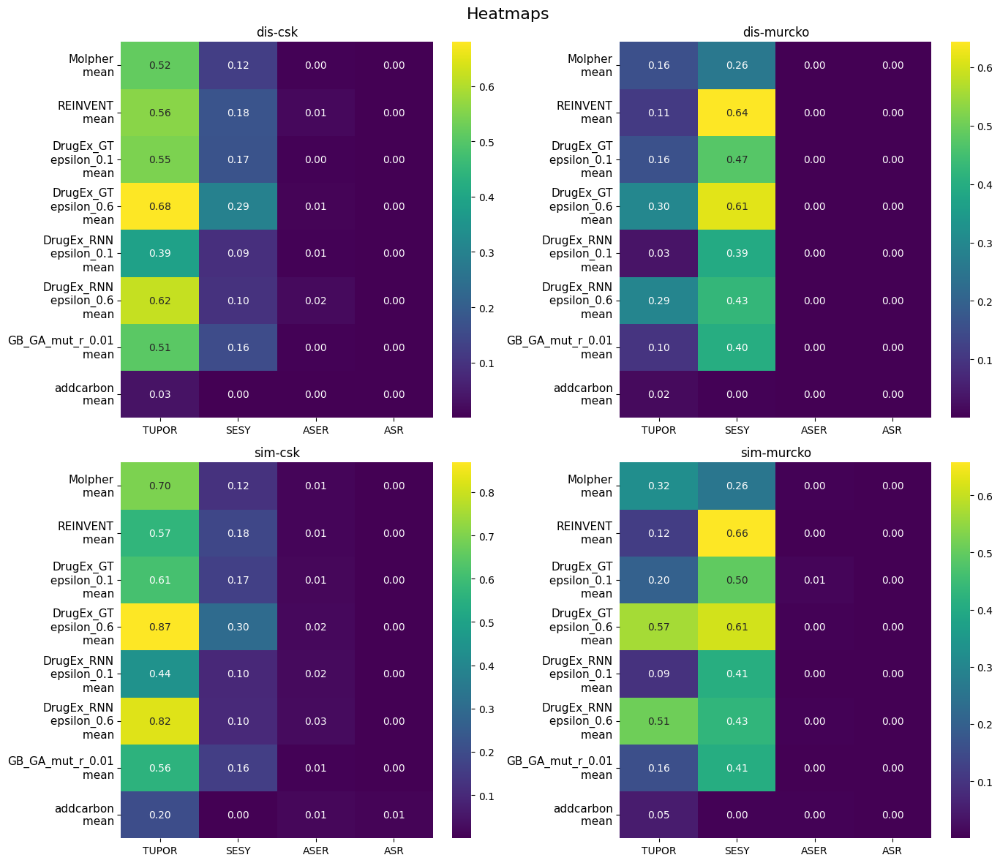

In [143]:
# Initialize empty dictionaries to store data and titles for each subset
subset_dict = {}
subset_dict_data = {}

# Iterate over the different types of splits ('dis', 'sim') and scaffold types ('csk', 'murcko')
for i, type_split in enumerate(['dis', 'sim']):
    for j, scaf in enumerate(['csk', 'murcko']):
        # Load the DataFrame for the 'base' subset from the corresponding CSV file
        # The file path is constructed dynamically based on the type_split and scaf
        df = pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}.csv")
        
        # Store the loaded DataFrame in the subset_dict with a key representing its position in the grid (i,j)
        subset_dict[f'{i},{j}'] = df
        
        # Store a descriptive title for the subset in subset_dict_data (e.g., 'dis-csk', 'sim-murcko')
        subset_dict_data[f'{i},{j}'] = f'{type_split}-{scaf}'

# Call the plot_heatmap_base function to plot the heatmaps for all subsets in the subset_dict
# The title 'Heatmaps' will be displayed for the overall figure
hv.plot_heatmap_base(subset_dict, subset_dict_data, title = f'Heatmaps')


### Plotting Heatmaps for Various Subsets Compared to Baseline Data for Different Split Types and Scaffold Combinations


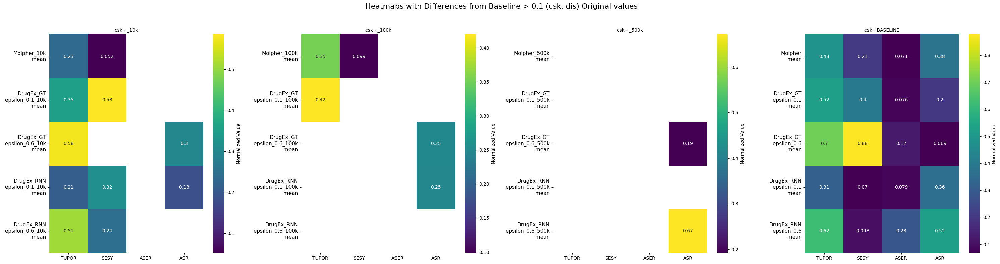

/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


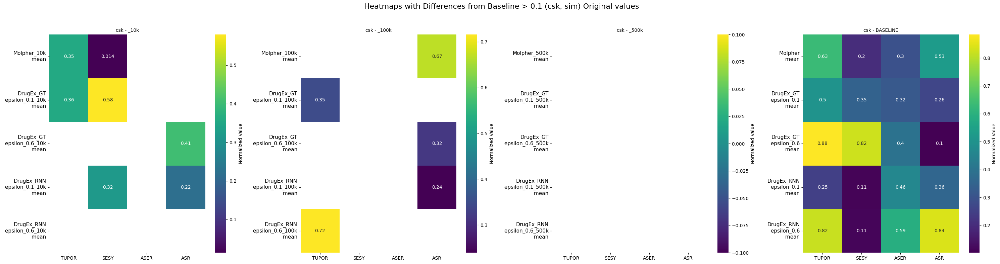

In [145]:
for type_split in ['dis', 'sim']:  # Iterate through different split types (dis, sim)
    for scaf in ['csk']:  # Iterate through scaffold types (e.g., csk)
        
        # Load the baseline data for the given split type and scaffold
        base_line = pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_norm_min_max.csv")
        
        # Prepare a dictionary to store the data for different subsets
        # These subsets are differentiated by the suffixes (e.g., '_10k', '_100k', etc.)
        data_dict = {
            '_10k': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_10k_norm_min_max.csv"),
            '_100k': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_100k_norm_min_max.csv"),
            '_500k': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_500k_norm_min_max.csv"),
            '': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_norm_min_max.csv")  # Base is the subset with no suffix
        }
        
        # Call the function 'plot_heatmaps_from_baseline' to plot the heatmaps for each subset and compare them with the baseline
        hv.plot_heatmaps_from_baseline(base_line, data_dict, type_split, scaf)


### Visualization of Heatmaps for Differences Between Baseline and Other Subsets

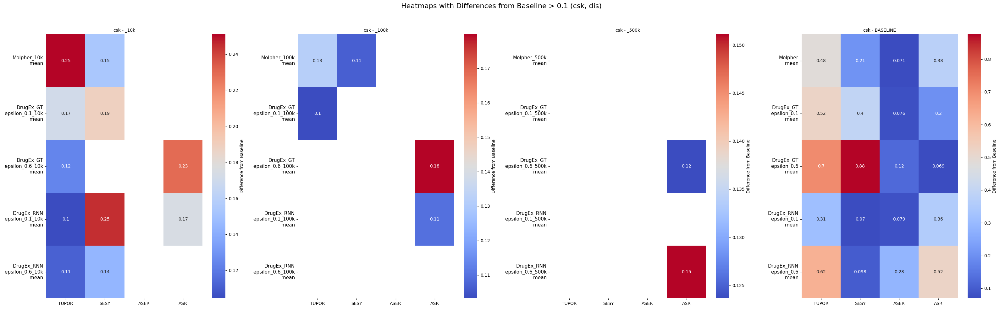

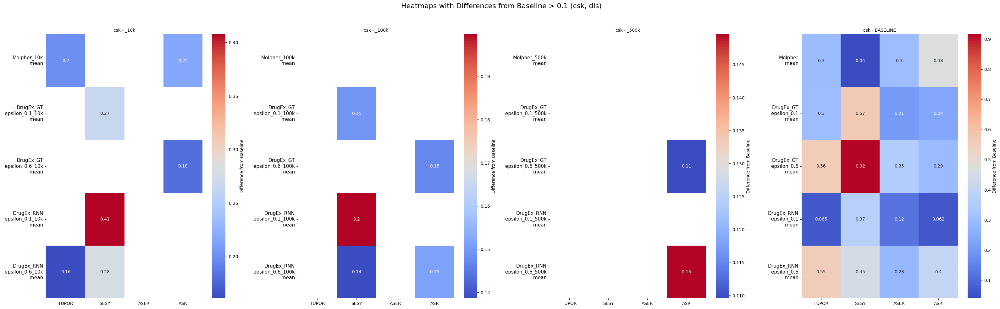

/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


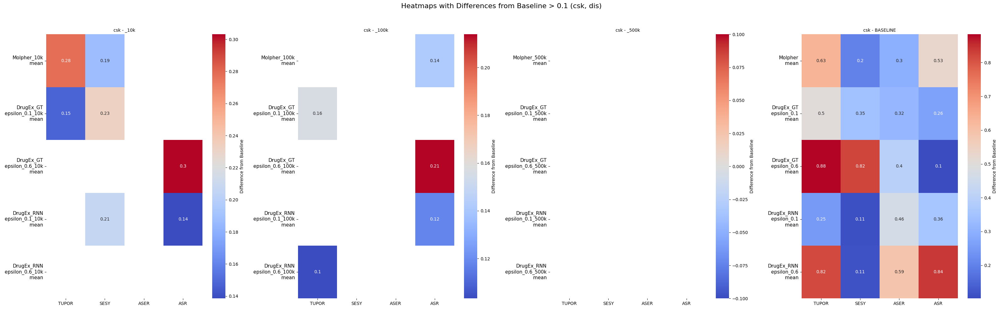

/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


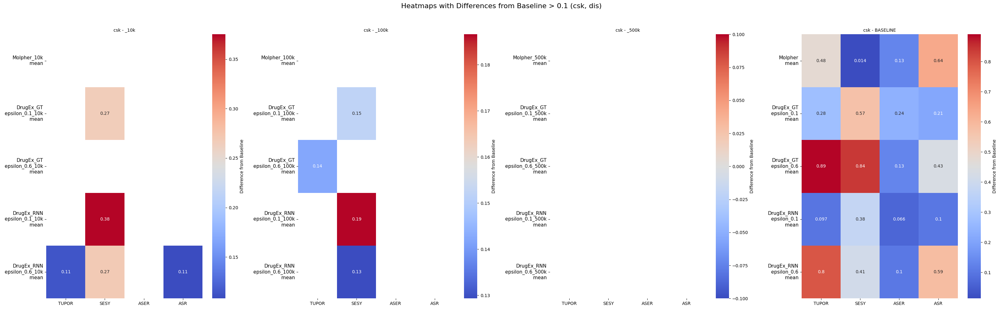

In [154]:
for type_split in ['dis', 'sim']:
    for scaf in ['csk', 'murcko']:
        # Load the baseline data (replace with your actual file paths)
        baseline_df = pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_norm_min_max.csv")

        # Prepare the dictionary of subsets
        data_dict = {
            '_10k': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_10k_norm_min_max.csv"),
            '_100k': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_100k_norm_min_max.csv"),
            '_500k': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_500k_norm_min_max.csv"),
            '': pd.read_csv(f"data/results/Glucocorticoid_receptor/{scaf}_scaffolds/{type_split}/mean_{scaf}_{type_split}_norm_min_max.csv")  # Base is the subset with no suffix
        }

        # Call the function to plot heatmaps
        hv.plot_heatmaps_with_diff_from_baseline(baseline_df, data_dict, type_split='dis', scaf='csk')


# RADAR PLOTS

In [163]:
from scripts import radar_plot as ra
import importlib as imp
imp.reload(ra)


<module 'scripts.radar_plot' from '/home/filv/phd_projects/iga_2023/git_reccal/new/recall_metrics/scripts/radar_plot.py'>

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_10k_mean,dis,csk,2373.0,10301.0,0.135694,0.230816,0.007521,0.002168,75.6
1,REINVENT_10k_mean,dis,csk,4665.6,9929.4,0.214356,0.469872,0.015037,0.001821,142.8
2,DrugEx_GT_epsilon_0.1_10k_mean,dis,csk,4646.6,9992.6,0.204154,0.465010,0.004986,0.001640,49.4
3,DrugEx_GT_epsilon_0.6_10k_mean,dis,csk,5939.2,9992.2,0.334552,0.594376,0.008233,0.001988,81.2
4,DrugEx_RNN_epsilon_0.1_10k_mean,dis,csk,3464.2,9994.8,0.121609,0.346611,0.004669,0.001215,46.0
5,DrugEx_RNN_epsilon_0.6_10k_mean,dis,csk,3115.2,9899.6,0.296115,0.314646,0.018437,0.003287,173.8
6,GB_GA_mut_r_0.01_10k_mean,dis,csk,5805.4,9999.4,0.187793,0.580575,0.002896,0.001198,28.8
7,addcarbon_10k_mean,dis,csk,708.2,10000.0,0.033403,0.070820,0.001545,0.001700,15.4


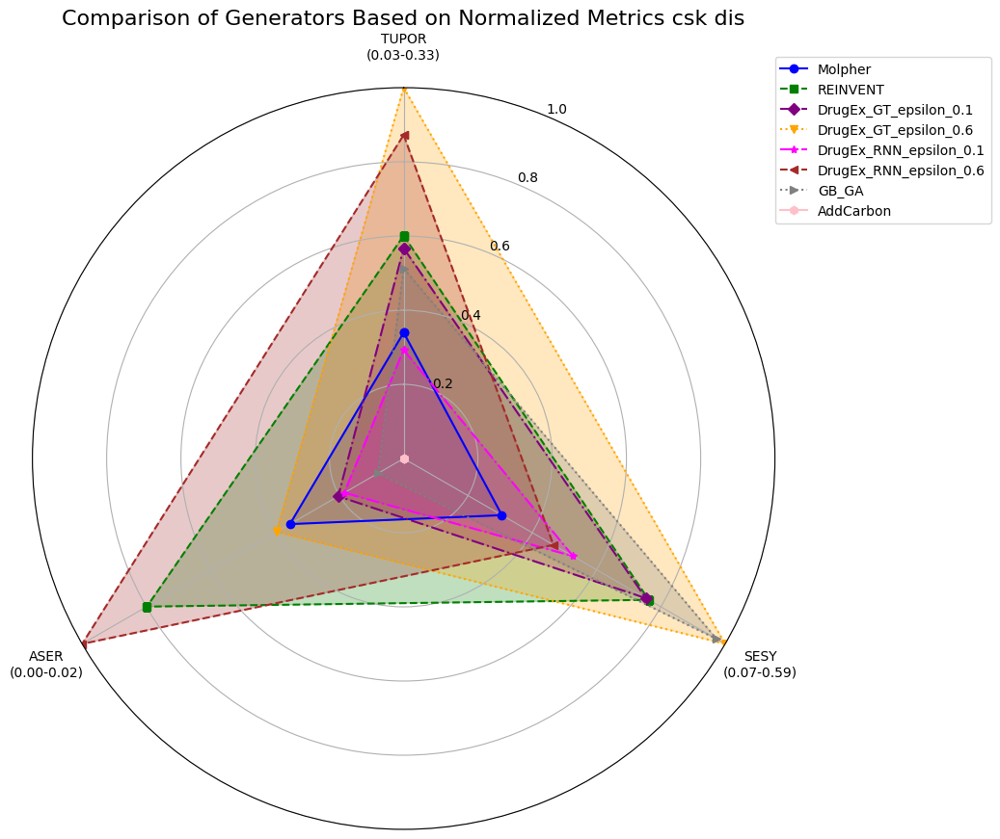

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_100k_mean,dis,csk,18089.0,102838.8,0.319333,0.176107,0.004679,0.000646,467.6
1,REINVENT_100k_mean,dis,csk,29214.6,99218.0,0.384996,0.294453,0.014324,0.000508,1361.8
2,DrugEx_GT_epsilon_0.1_100k_mean,dis,csk,28386.0,99918.0,0.370269,0.284100,0.004832,0.000474,478.8
3,DrugEx_GT_epsilon_0.6_100k_mean,dis,csk,42335.8,99935.6,0.556827,0.423626,0.007849,0.000475,775.0
4,DrugEx_RNN_epsilon_0.1_100k_mean,dis,csk,17642.0,99946.8,0.245537,0.176518,0.005116,0.000473,503.6
5,DrugEx_RNN_epsilon_0.6_100k_mean,dis,csk,17451.8,99015.6,0.495159,0.176263,0.018555,0.000983,1747.6
6,GB_GA_mut_r_0.01_100k_mean,dis,csk,32930.4,99993.8,0.364609,0.329324,0.003083,0.000398,306.4
7,addcarbon_100k_mean,dis,csk,853.2,100000.0,0.033403,0.008532,0.001876,0.001397,187.0


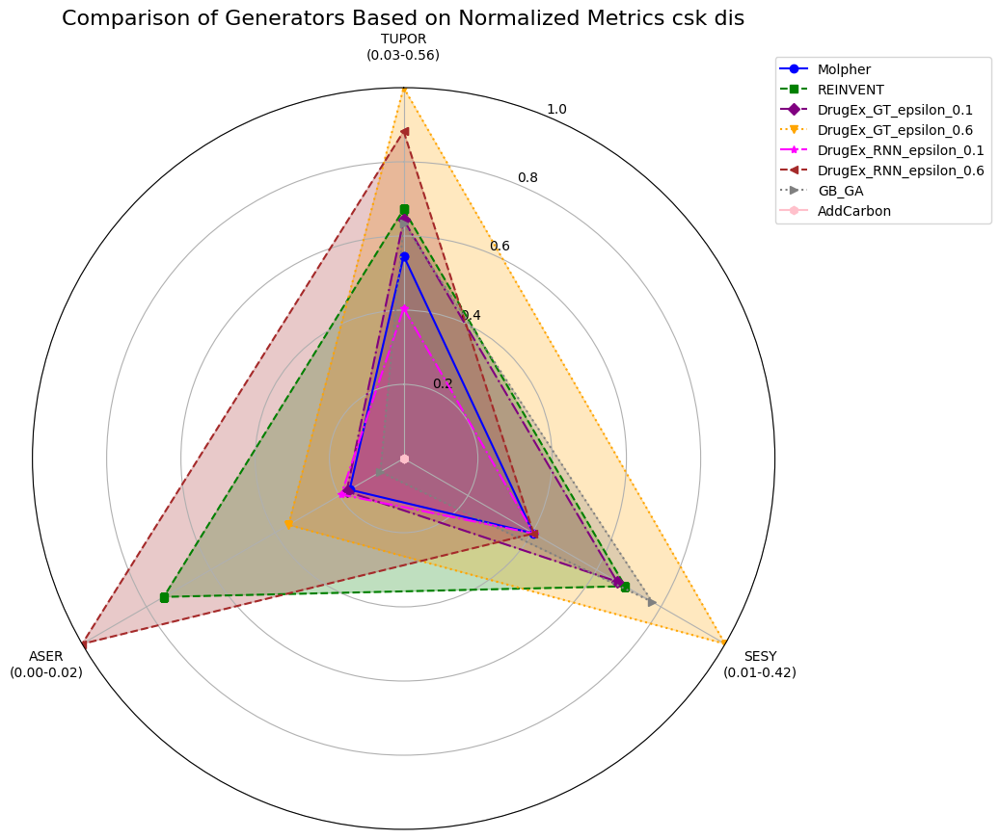

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_500k_mean,dis,csk,69427.4,514021.6,0.477581,0.135278,0.004557,0.000242,2275.4
1,REINVENT_500k_mean,dis,csk,102091.2,496147.8,0.510960,0.205767,0.014093,0.000191,6703.4
2,DrugEx_GT_epsilon_0.1_500k_mean,dis,csk,96988.6,499599.8,0.514655,0.194139,0.004967,0.000187,2460.0
3,DrugEx_GT_epsilon_0.6_500k_mean,dis,csk,162875.2,499689.2,0.659998,0.325950,0.007989,0.000146,3942.8
4,DrugEx_RNN_epsilon_0.1_500k_mean,dis,csk,52778.4,499731.8,0.349314,0.105616,0.005114,0.000236,2517.2
5,DrugEx_RNN_epsilon_0.6_500k_mean,dis,csk,56873.4,495029.0,0.581010,0.114897,0.018414,0.000356,8681.8
6,GB_GA_mut_r_0.01_500k_mean,dis,csk,98819.0,499978.6,0.467761,0.197646,0.003140,0.000169,1560.2
7,addcarbon_500k_mean,dis,csk,856.8,500000.0,0.033403,0.001714,0.001877,0.001392,935.4


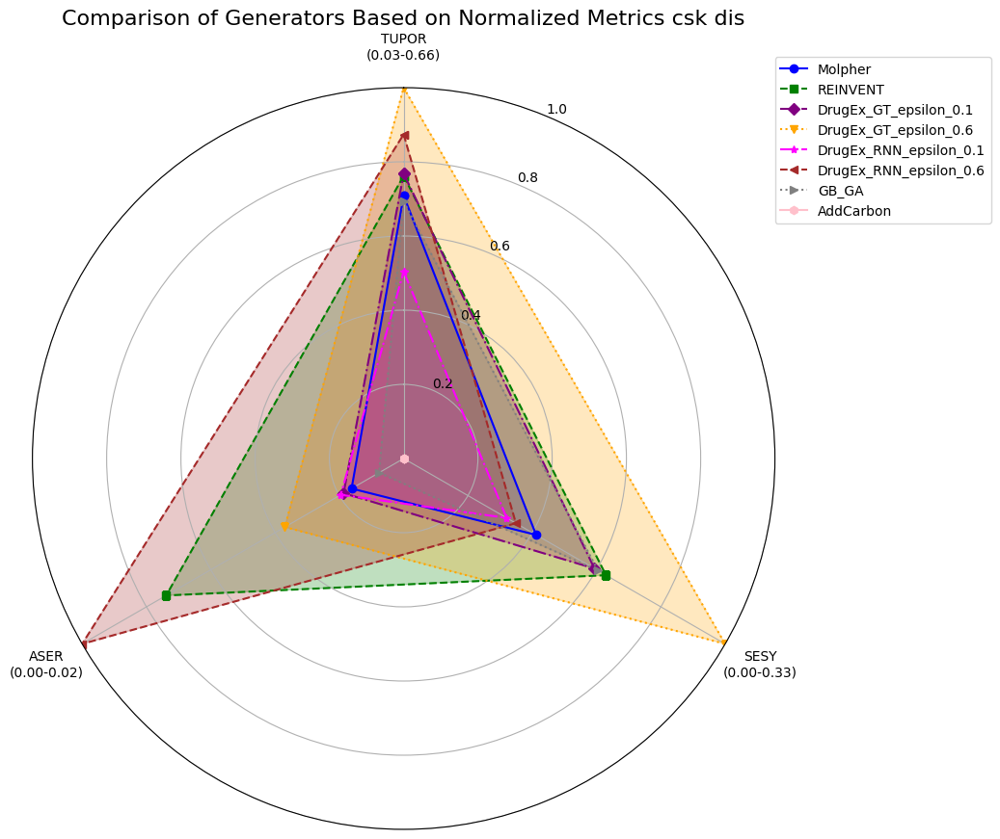

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_mean,dis,csk,100068.0,823977.8,0.516682,0.124815,0.004628,0.000199,3041.2
1,REINVENT_mean,dis,csk,169670.2,964580.2,0.559826,0.175880,0.014068,0.000126,13023.4
2,DrugEx_GT_epsilon_0.1_mean,dis,csk,140428.0,809233.2,0.545466,0.172969,0.004957,0.000137,4063.2
3,DrugEx_GT_epsilon_0.6_mean,dis,csk,267648.0,907474.4,0.679649,0.294816,0.007986,0.000092,7186.4
4,DrugEx_RNN_epsilon_0.1_mean,dis,csk,72000.6,797636.8,0.387368,0.090468,0.005128,0.000192,3941.0
5,DrugEx_RNN_epsilon_0.6_mean,dis,csk,87100.4,891065.4,0.620167,0.097631,0.018319,0.000249,15682.2
6,GB_GA_mut_r_0.01_mean,dis,csk,155460.6,999951.8,0.506975,0.155468,0.003155,0.000116,3134.6
7,addcarbon_mean,dis,csk,856.8,1000000.0,0.033403,0.000857,0.001833,0.001392,1827.0


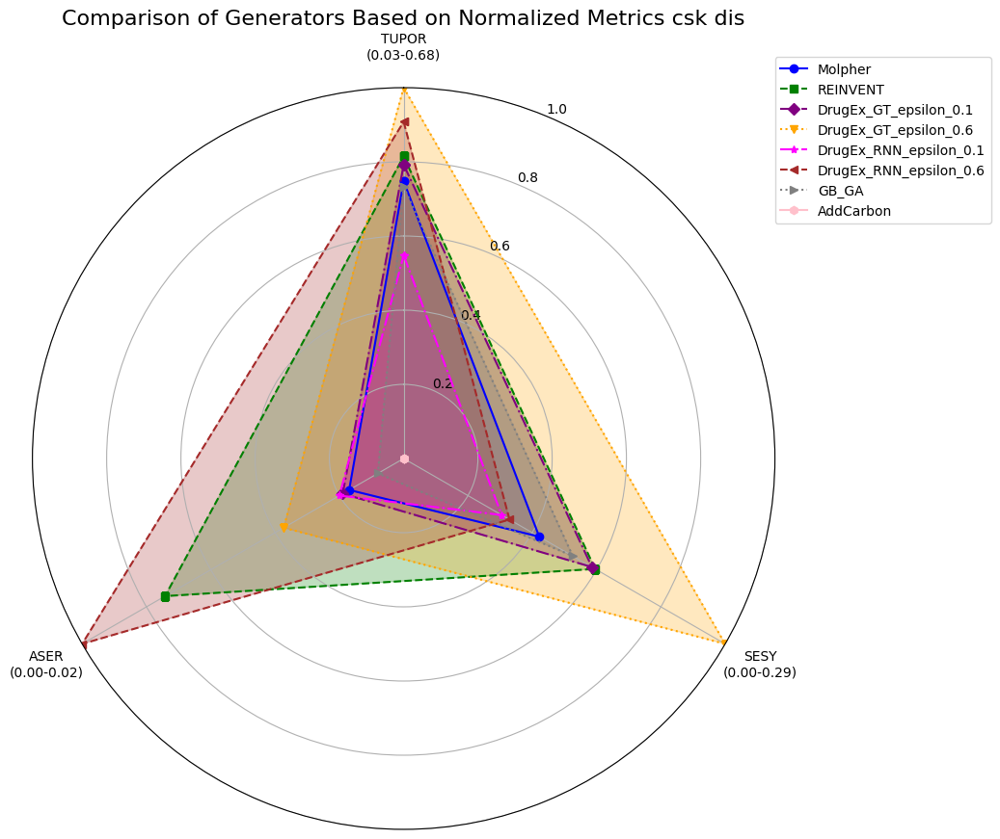

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_10k_mean,dis,murcko,3573.6,10301.0,0.014017,0.347475,0.002052,0.000337,20.6
1,REINVENT_10k_mean,dis,murcko,8842.6,9929.8,0.021736,0.890509,0.000201,0.000136,2.0
2,DrugEx_GT_epsilon_0.1_10k_mean,dis,murcko,7777.4,9992.8,0.036850,0.778309,0.001185,0.000361,11.8
3,DrugEx_GT_epsilon_0.6_10k_mean,dis,murcko,8428.4,9993.0,0.074603,0.843425,0.001706,0.000613,17.0
4,DrugEx_RNN_epsilon_0.1_10k_mean,dis,murcko,7440.2,9999.8,0.018478,0.744035,0.000681,0.000131,6.8
5,DrugEx_RNN_epsilon_0.6_10k_mean,dis,murcko,7119.2,9908.8,0.056960,0.718419,0.001193,0.000497,11.8
6,GB_GA_mut_r_0.01_10k_mean,dis,murcko,8044.0,9999.4,0.017733,0.804449,0.000300,0.000173,3.0
7,addcarbon_10k_mean,dis,murcko,1891.6,10000.0,0.012596,0.189160,0.000661,0.000398,6.6


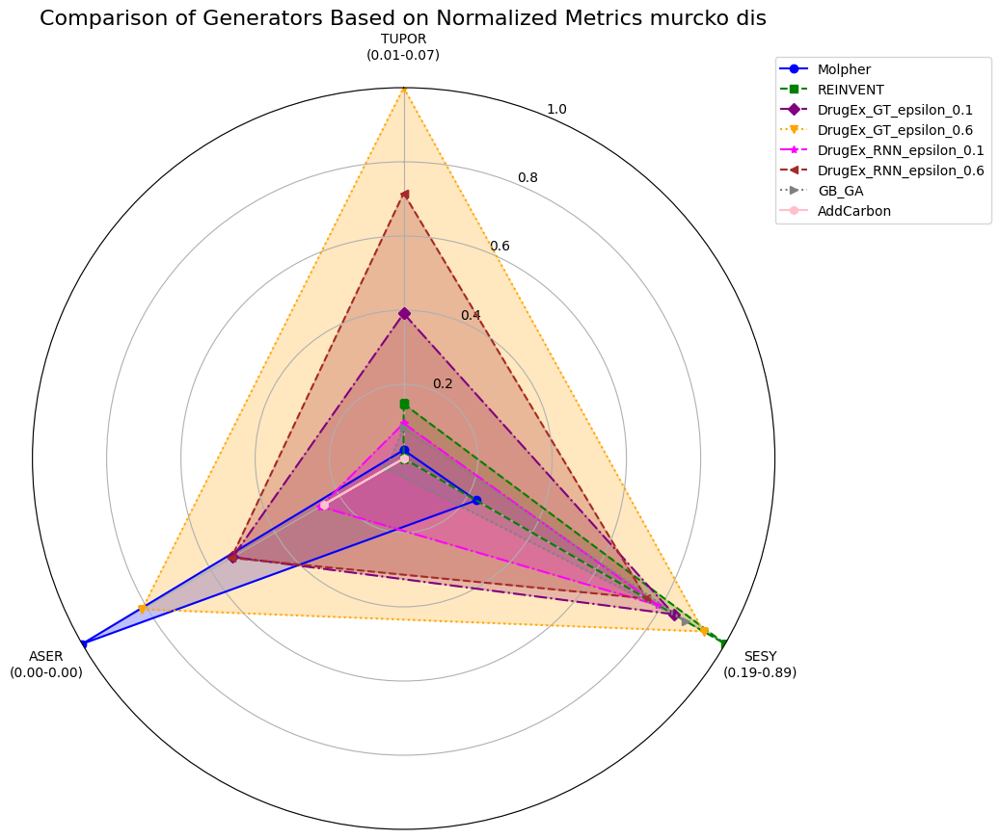

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_100k_mean,dis,murcko,31448.8,102839.2,0.071435,0.306123,0.001715,0.000179,171.0
1,REINVENT_100k_mean,dis,murcko,77819.0,99229.8,0.054323,0.784233,0.000192,0.000051,19.0
2,DrugEx_GT_epsilon_0.1_100k_mean,dis,murcko,63011.4,99920.8,0.083721,0.630630,0.001068,0.000097,106.4
3,DrugEx_GT_epsilon_0.6_100k_mean,dis,murcko,73003.8,99945.2,0.172531,0.730436,0.001817,0.000163,181.0
4,DrugEx_RNN_epsilon_0.1_100k_mean,dis,murcko,55878.6,99994.0,0.029997,0.558820,0.000619,0.000035,61.8
5,DrugEx_RNN_epsilon_0.6_100k_mean,dis,murcko,56381.4,99115.4,0.178854,0.568834,0.001511,0.000205,149.4
6,GB_GA_mut_r_0.01_100k_mean,dis,murcko,60456.0,99993.8,0.048716,0.604597,0.000362,0.000056,36.2
7,addcarbon_100k_mean,dis,murcko,2942.0,100000.0,0.015227,0.029420,0.000746,0.000317,74.4


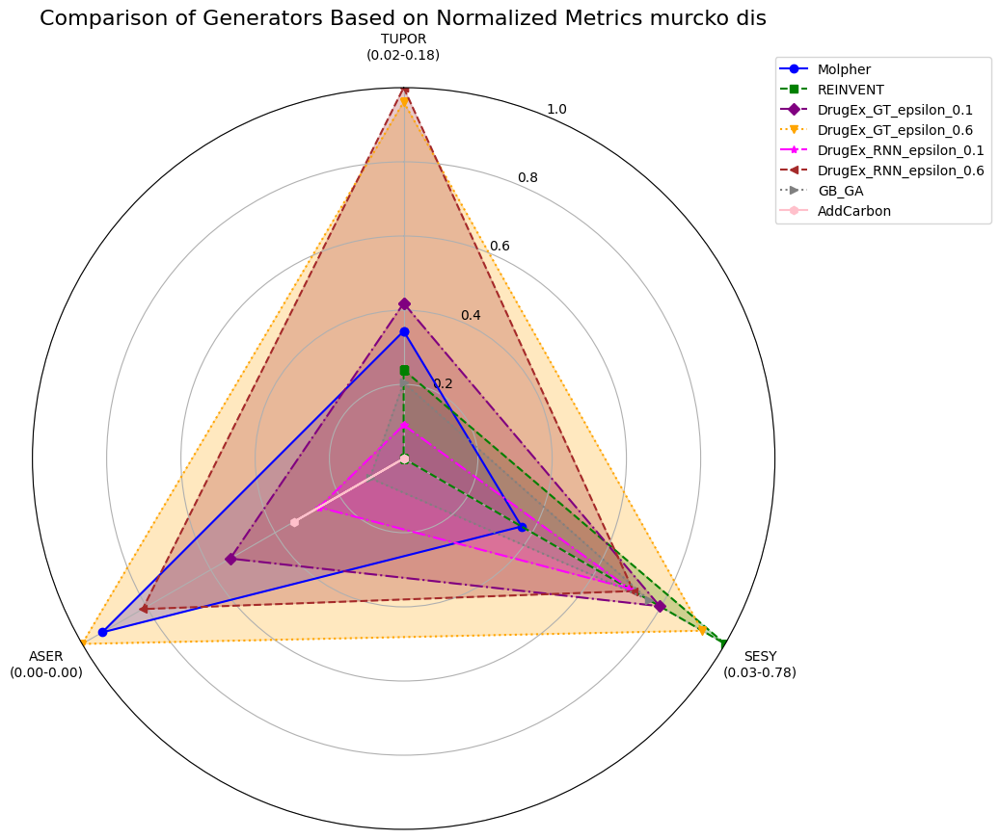

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_500k_mean,dis,murcko,138118.4,514025.2,0.126791,0.268958,0.001487,0.000066,741.6
1,REINVENT_500k_mean,dis,murcko,340469.0,496196.8,0.090810,0.686156,0.000205,0.000020,101.8
2,DrugEx_GT_epsilon_0.1_500k_mean,dis,murcko,254794.8,499617.4,0.134348,0.509998,0.001074,0.000038,535.0
3,DrugEx_GT_epsilon_0.6_500k_mean,dis,murcko,322751.2,499731.2,0.264441,0.645848,0.001842,0.000056,917.6
4,DrugEx_RNN_epsilon_0.1_500k_mean,dis,murcko,213646.8,499971.2,0.034344,0.427318,0.000624,0.000011,311.8
5,DrugEx_RNN_epsilon_0.6_500k_mean,dis,murcko,229524.0,495535.0,0.268684,0.463175,0.001502,0.000076,742.6
6,GB_GA_mut_r_0.01_500k_mean,dis,murcko,228441.8,499978.6,0.082457,0.456903,0.000363,0.000023,181.2
7,addcarbon_500k_mean,dis,murcko,2969.0,500000.0,0.015227,0.005938,0.000741,0.000314,369.4


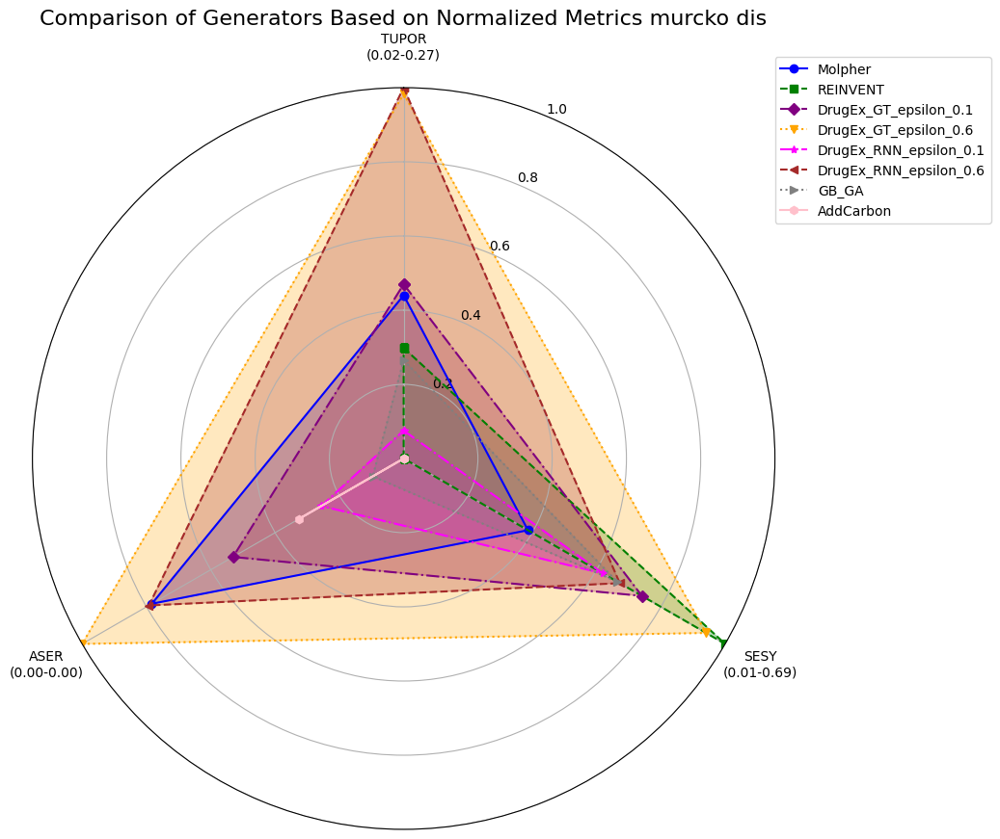

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_mean,dis,murcko,209855.8,823982.2,0.156880,0.258177,0.001557,0.000059,1085.6
1,REINVENT_mean,dis,murcko,620549.2,964674.4,0.108451,0.643241,0.000210,0.000014,202.2
2,DrugEx_GT_epsilon_0.1_mean,dis,murcko,385041.6,809261.8,0.158625,0.474578,0.001083,0.000030,878.8
3,DrugEx_GT_epsilon_0.6_mean,dis,murcko,557492.4,907555.6,0.296619,0.614171,0.001845,0.000036,1675.8
4,DrugEx_RNN_epsilon_0.1_mean,dis,murcko,311685.8,798015.2,0.034344,0.391420,0.000624,0.000008,483.2
5,DrugEx_RNN_epsilon_0.6_mean,dis,murcko,379335.4,892001.0,0.293510,0.425017,0.001484,0.000050,1314.4
6,GB_GA_mut_r_0.01_mean,dis,murcko,400851.0,999951.8,0.097065,0.400870,0.000358,0.000016,357.8
7,addcarbon_mean,dis,murcko,2969.0,1000000.0,0.015227,0.002969,0.000726,0.000314,724.0


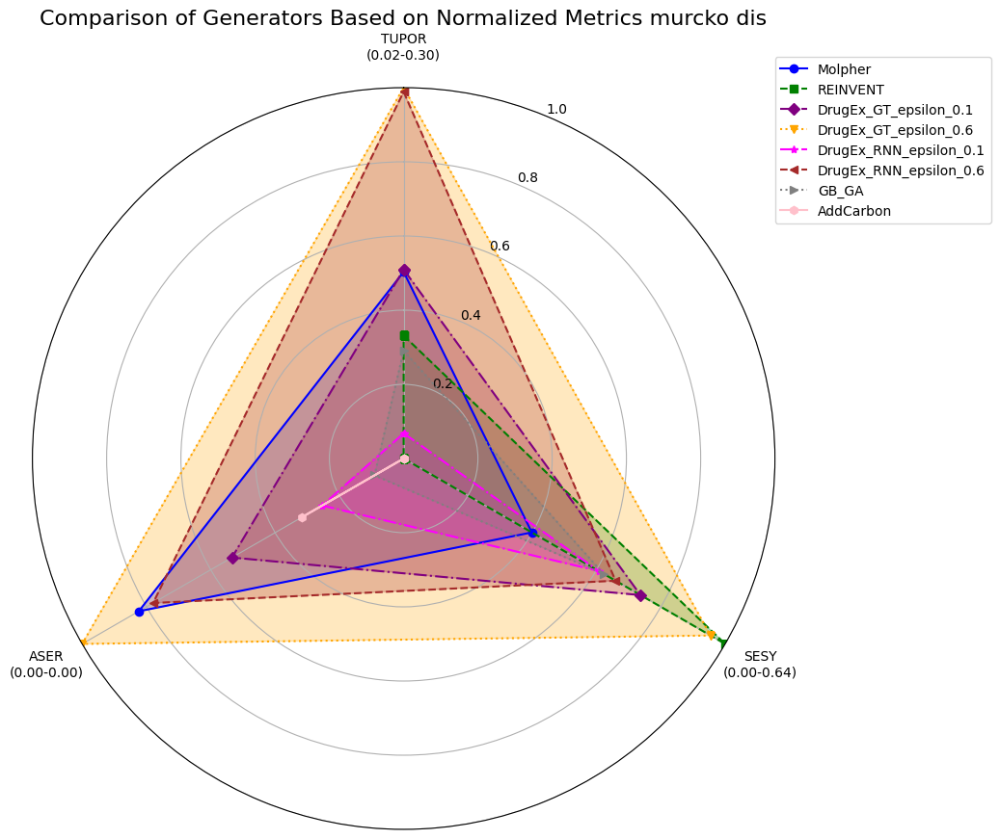

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_10k_mean,sim,csk,2288.6,10131.4,0.260963,0.225903,0.012688,0.004208,126.2
1,REINVENT_10k_mean,sim,csk,4871.2,9934.0,0.283703,0.490354,0.012984,0.002141,126.8
2,DrugEx_GT_epsilon_0.1_10k_mean,sim,csk,4824.0,9990.8,0.261630,0.482846,0.015170,0.001969,146.8
3,DrugEx_GT_epsilon_0.6_10k_mean,sim,csk,6027.8,9994.8,0.523637,0.603088,0.016952,0.003193,166.0
4,DrugEx_RNN_epsilon_0.1_10k_mean,sim,csk,3631.6,9990.2,0.195314,0.363482,0.019838,0.001926,193.4
5,DrugEx_RNN_epsilon_0.6_10k_mean,sim,csk,3137.6,9915.4,0.489921,0.316409,0.027513,0.005784,263.6
6,GB_GA_mut_r_0.01_10k_mean,sim,csk,5892.2,9999.6,0.300561,0.589243,0.006143,0.001883,61.0
7,addcarbon_10k_mean,sim,csk,721.8,10000.0,0.195834,0.072180,0.014765,0.010198,144.4


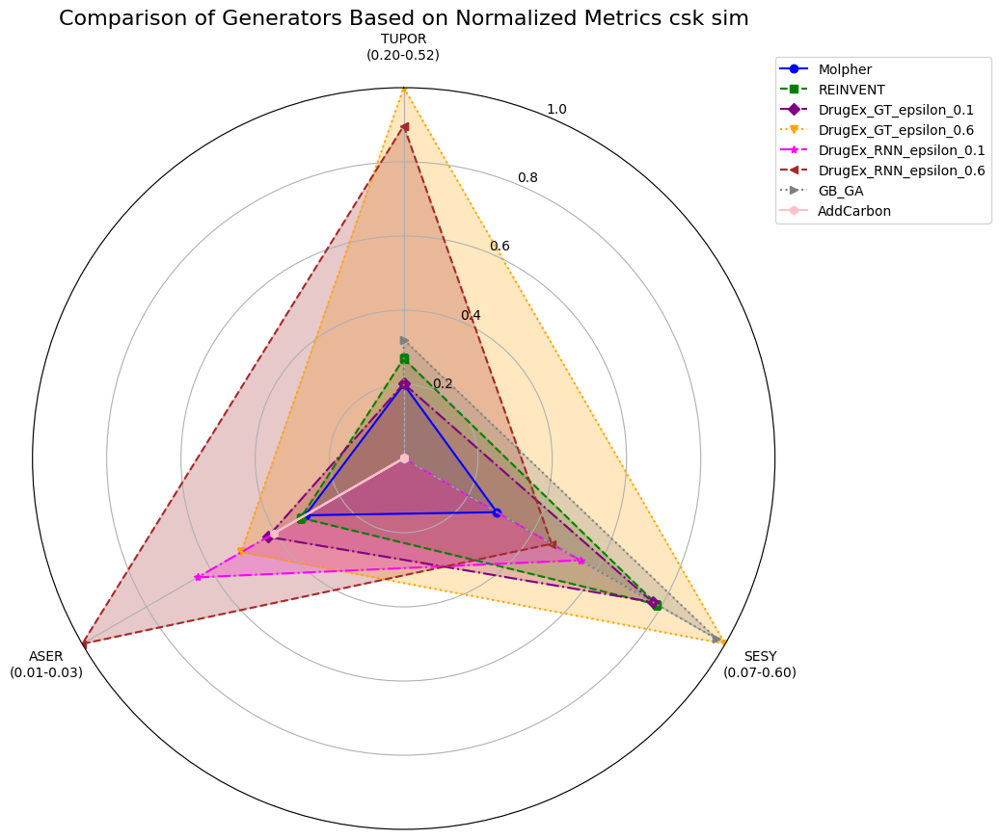

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_100k_mean,sim,csk,17845.4,100118.8,0.560146,0.178243,0.013485,0.001152,1328.8
1,REINVENT_100k_mean,sim,csk,30599.4,99419.6,0.414054,0.307779,0.012436,0.000498,1217.4
2,DrugEx_GT_epsilon_0.1_100k_mean,sim,csk,28320.2,99915.2,0.408649,0.283439,0.013957,0.000529,1352.0
3,DrugEx_GT_epsilon_0.6_100k_mean,sim,csk,42912.6,99945.6,0.764190,0.429350,0.017386,0.000652,1702.4
4,DrugEx_RNN_epsilon_0.1_100k_mean,sim,csk,19141.0,99913.0,0.288681,0.191559,0.020775,0.000544,2023.6
5,DrugEx_RNN_epsilon_0.6_100k_mean,sim,csk,17627.4,99154.6,0.697683,0.177747,0.026258,0.001461,2519.2
6,GB_GA_mut_r_0.01_100k_mean,sim,csk,33420.8,99997.2,0.469677,0.334217,0.006357,0.000517,631.2
7,addcarbon_100k_mean,sim,csk,861.4,100000.0,0.201548,0.008614,0.014552,0.008716,1424.4


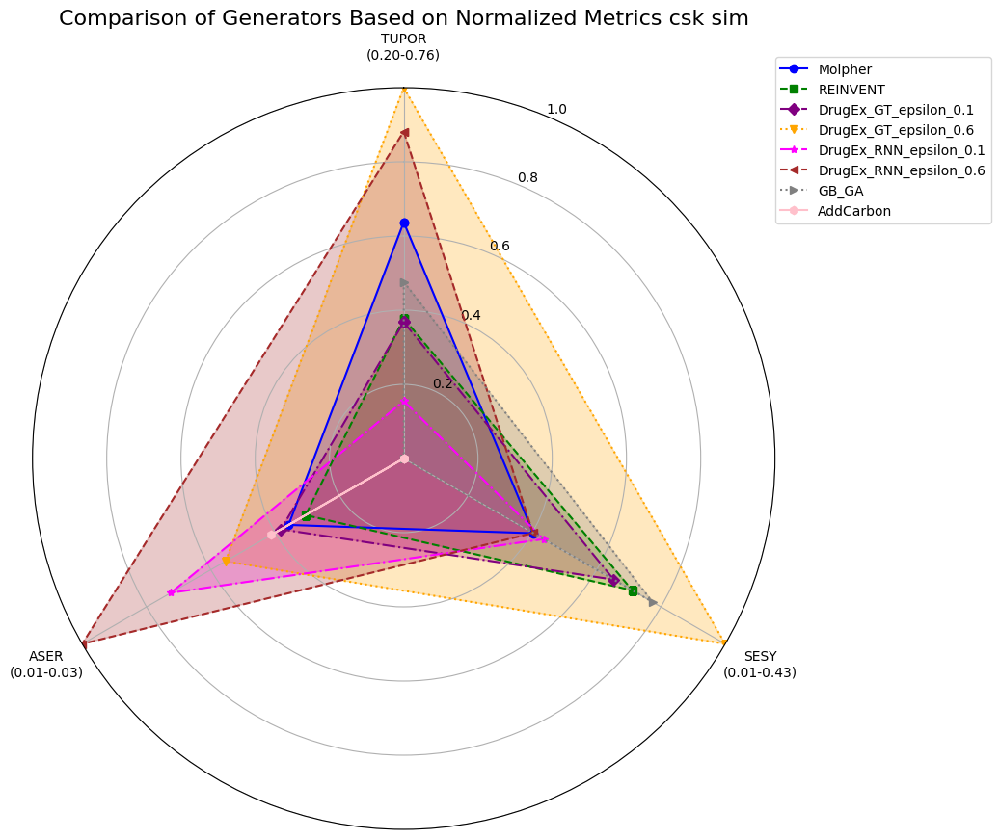

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_500k_mean,sim,csk,68826.6,500345.4,0.681918,0.137555,0.013491,0.000363,6644.8
1,REINVENT_500k_mean,sim,csk,106980.8,497121.0,0.546304,0.215201,0.012642,0.000187,6186.8
2,DrugEx_GT_epsilon_0.1_500k_mean,sim,csk,94092.2,499550.4,0.550571,0.188348,0.014176,0.000217,6860.0
3,DrugEx_GT_epsilon_0.6_500k_mean,sim,csk,165521.4,499745.4,0.857960,0.331203,0.017507,0.000190,8572.2
4,DrugEx_RNN_epsilon_0.1_500k_mean,sim,csk,58113.6,499580.2,0.407889,0.116314,0.020620,0.000260,10044.8
5,DrugEx_RNN_epsilon_0.6_500k_mean,sim,csk,57899.8,495782.2,0.802764,0.116761,0.026287,0.000512,12609.8
6,GB_GA_mut_r_0.01_500k_mean,sim,csk,100604.0,499987.6,0.557163,0.201213,0.006531,0.000204,3242.2
7,addcarbon_500k_mean,sim,csk,863.8,500000.0,0.201548,0.001728,0.014564,0.008687,7127.8


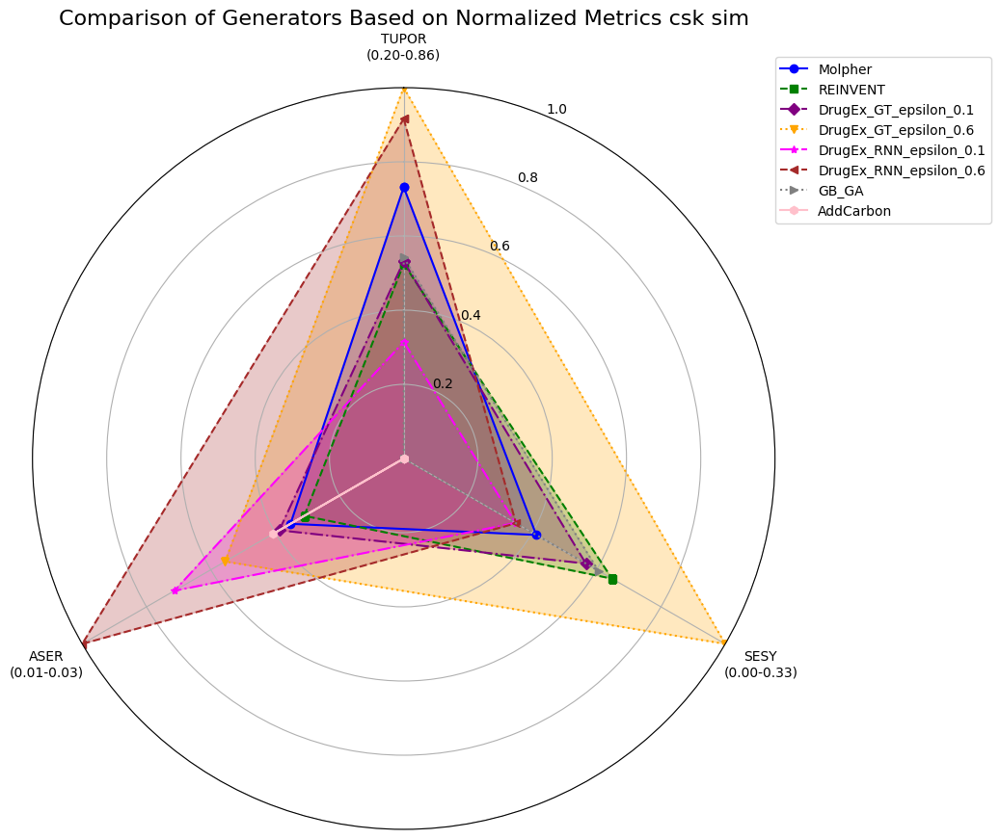

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_mean,sim,csk,103807.6,836443.4,0.698610,0.124157,0.013227,0.000247,10759.2
1,REINVENT_mean,sim,csk,177692.0,964258.0,0.567807,0.184285,0.012688,0.000117,12041.2
2,DrugEx_GT_epsilon_0.1_mean,sim,csk,136686.8,829696.4,0.611599,0.165093,0.014132,0.000167,11091.0
3,DrugEx_GT_epsilon_0.6_mean,sim,csk,272645.2,909722.6,0.868628,0.299685,0.017626,0.000117,15686.4
4,DrugEx_RNN_epsilon_0.1_mean,sim,csk,83562.4,847611.2,0.440370,0.098448,0.020599,0.000195,17138.8
5,DrugEx_RNN_epsilon_0.6_mean,sim,csk,88952.2,891914.4,0.824861,0.099675,0.026326,0.000343,22643.4
6,GB_GA_mut_r_0.01_mean,sim,csk,158919.0,999971.6,0.557163,0.158923,0.006514,0.000129,6467.2
7,addcarbon_mean,sim,csk,863.8,1000000.0,0.201548,0.000864,0.014542,0.008687,14233.8


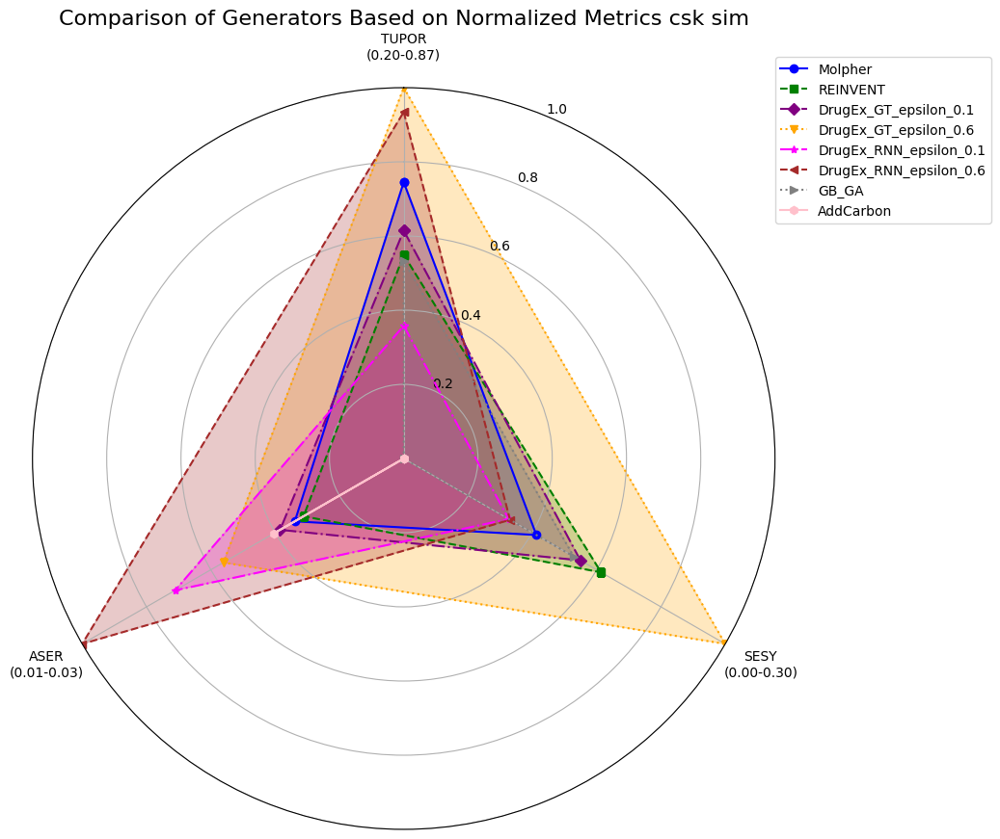

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_10k_mean,sim,murcko,3390.2,10131.4,0.071993,0.334653,0.006649,0.001532,66.4
1,REINVENT_10k_mean,sim,murcko,9013.0,9935.4,0.019061,0.907159,0.000201,0.000177,2.0
2,DrugEx_GT_epsilon_0.1_10k_mean,sim,murcko,8090.4,9991.0,0.046999,0.809768,0.008813,0.000495,85.4
3,DrugEx_GT_epsilon_0.6_10k_mean,sim,murcko,8454.6,9996.6,0.143870,0.845741,0.004740,0.001262,47.0
4,DrugEx_RNN_epsilon_0.1_10k_mean,sim,murcko,7608.8,9995.6,0.028326,0.761197,0.002558,0.000344,25.4
5,DrugEx_RNN_epsilon_0.6_10k_mean,sim,murcko,7159.2,9925.2,0.120332,0.721269,0.004051,0.001269,40.0
6,GB_GA_mut_r_0.01_10k_mean,sim,murcko,8096.0,9999.6,0.052569,0.809632,0.001985,0.000446,19.8
7,addcarbon_10k_mean,sim,murcko,1898.0,10000.0,0.046849,0.189800,0.003378,0.001486,33.6


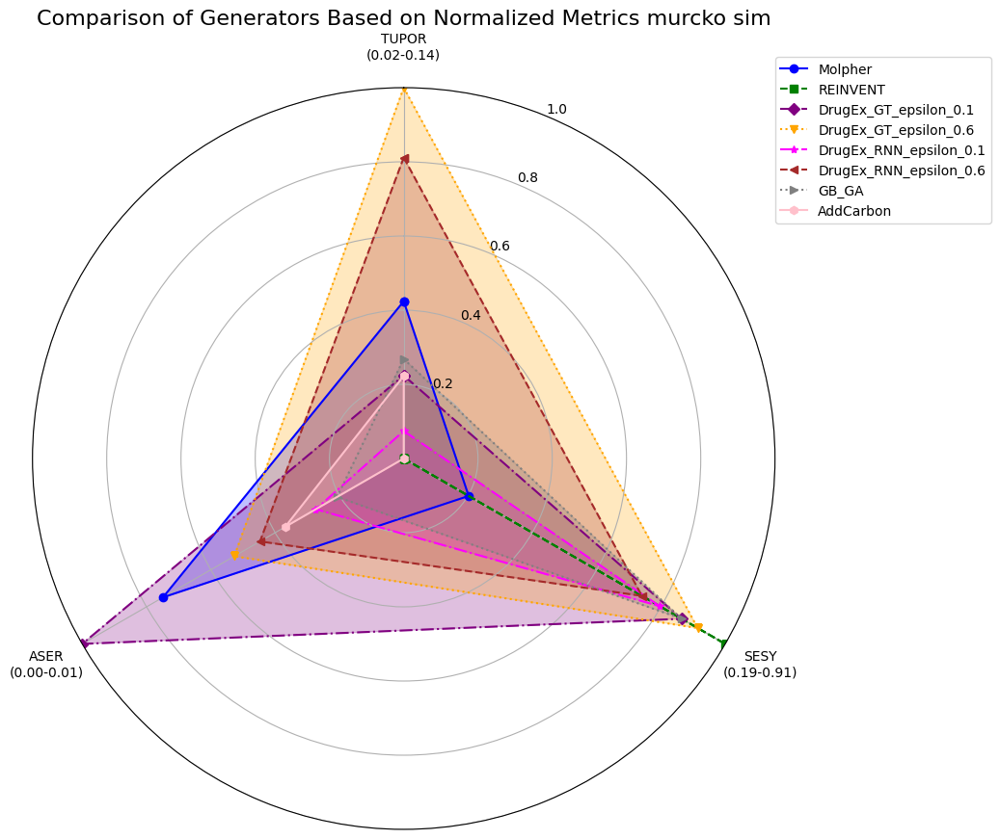

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_100k_mean,sim,murcko,30809.2,100118.8,0.224916,0.307727,0.004148,0.000511,412.6
1,REINVENT_100k_mean,sim,murcko,79498.8,99429.4,0.064231,0.799549,0.000181,0.000060,18.0
2,DrugEx_GT_epsilon_0.1_100k_mean,sim,murcko,66053.6,99917.0,0.096161,0.661087,0.008306,0.000122,805.4
3,DrugEx_GT_epsilon_0.6_100k_mean,sim,murcko,73026.4,99954.6,0.352163,0.730585,0.004635,0.000356,459.4
4,DrugEx_RNN_epsilon_0.1_100k_mean,sim,murcko,58177.6,99956.8,0.045648,0.582017,0.002411,0.000069,239.4
5,DrugEx_RNN_epsilon_0.6_100k_mean,sim,murcko,56804.8,99259.4,0.335276,0.572229,0.003636,0.000437,359.2
6,GB_GA_mut_r_0.01_100k_mean,sim,murcko,60946.6,99997.2,0.105370,0.609483,0.002045,0.000125,204.0
7,addcarbon_100k_mean,sim,murcko,2940.8,100000.0,0.050297,0.029408,0.003278,0.001013,326.2


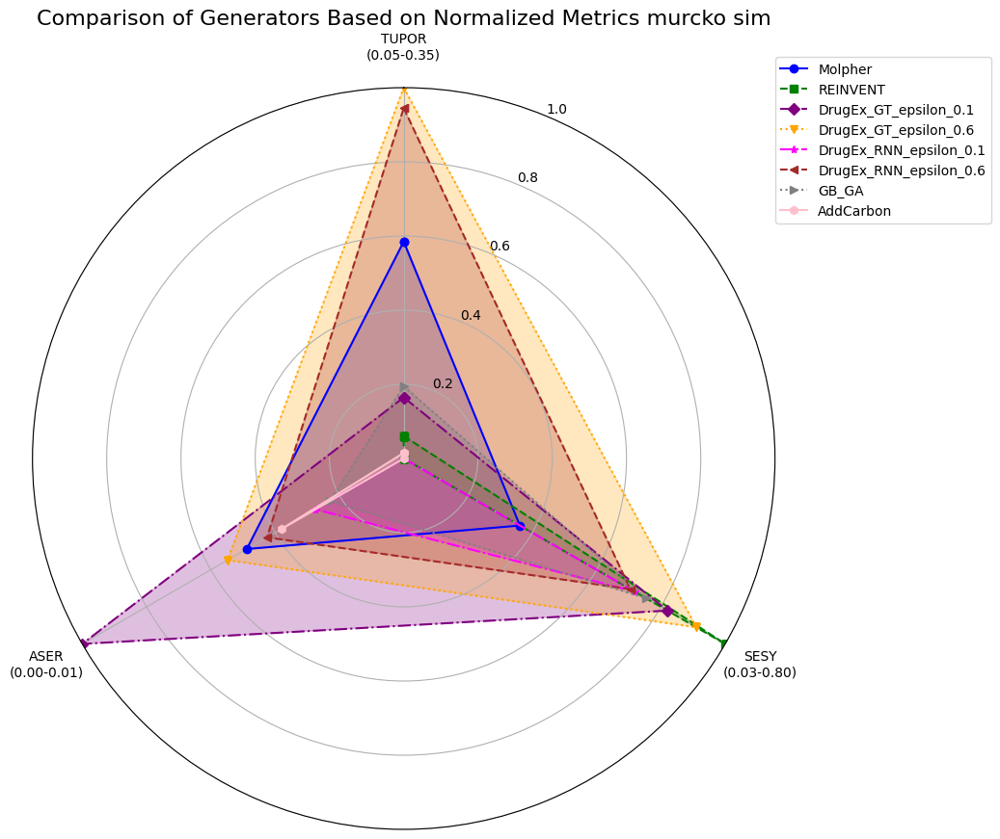

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_500k_mean,sim,murcko,135888.2,500355.8,0.284939,0.271578,0.004746,0.000149,2357.4
1,REINVENT_500k_mean,sim,murcko,348234.4,497164.2,0.093696,0.700442,0.000192,0.000021,95.6
2,DrugEx_GT_epsilon_0.1_500k_mean,sim,murcko,267627.2,499560.4,0.167839,0.535729,0.008472,0.000052,4104.6
3,DrugEx_GT_epsilon_0.6_500k_mean,sim,murcko,321936.6,499778.2,0.512140,0.644149,0.004710,0.000116,2334.2
4,DrugEx_RNN_epsilon_0.1_500k_mean,sim,murcko,226235.8,499798.8,0.079635,0.452645,0.002326,0.000029,1155.2
5,DrugEx_RNN_epsilon_0.6_500k_mean,sim,murcko,231724.2,496316.6,0.468789,0.466828,0.003602,0.000149,1779.2
6,GB_GA_mut_r_0.01_500k_mean,sim,murcko,230891.8,499987.6,0.135144,0.461795,0.001979,0.000042,987.4
7,addcarbon_500k_mean,sim,murcko,2970.8,500000.0,0.050297,0.005942,0.003352,0.001003,1668.0


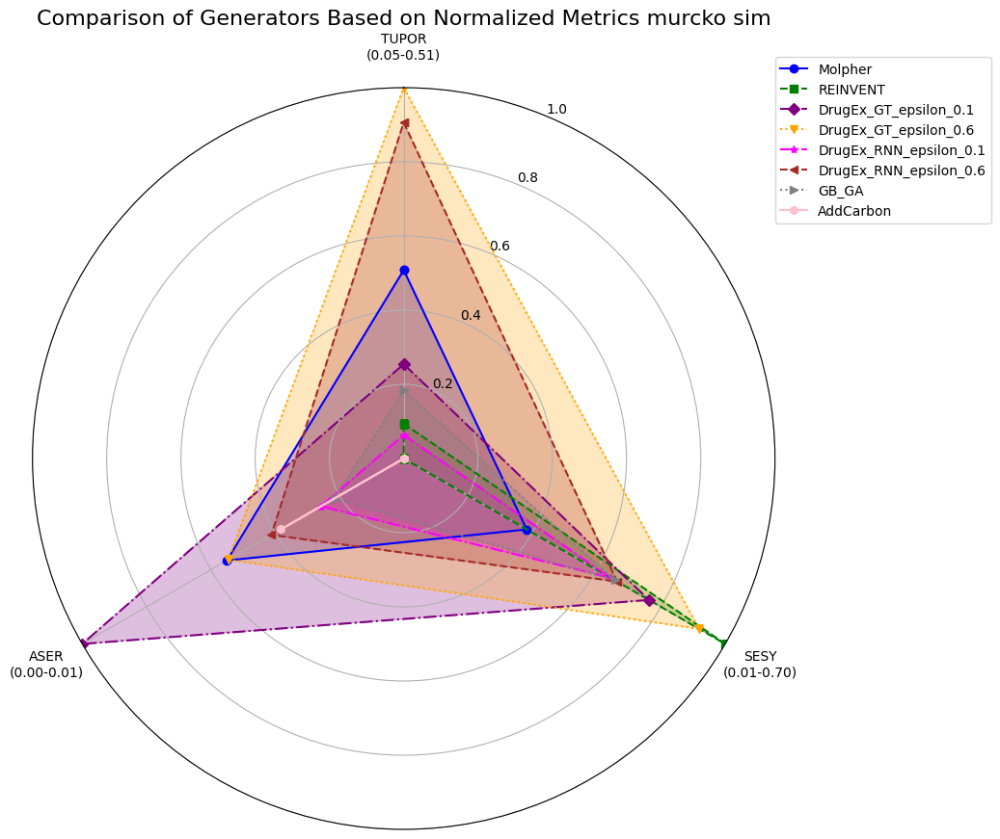

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ASR,CwASo
0,Molpher_mean,sim,murcko,215633.0,836455.8,0.321187,0.257852,0.004747,0.000106,3916.6
1,REINVENT_mean,sim,murcko,633958.2,964342.8,0.117835,0.657409,0.000208,0.000015,201.0
2,DrugEx_GT_epsilon_0.1_mean,sim,murcko,410774.0,829714.2,0.202269,0.495892,0.008448,0.000039,6545.2
3,DrugEx_GT_epsilon_0.6_mean,sim,murcko,556595.4,909782.8,0.569102,0.611760,0.004727,0.000074,4258.2
4,DrugEx_RNN_epsilon_0.1_mean,sim,murcko,351180.4,847988.2,0.092774,0.413200,0.002346,0.000022,1933.4
5,DrugEx_RNN_epsilon_0.6_mean,sim,murcko,383599.4,892866.6,0.512333,0.429329,0.003668,0.000098,3265.8
6,GB_GA_mut_r_0.01_mean,sim,murcko,406009.8,999971.6,0.157545,0.406021,0.001959,0.000027,1954.0
7,addcarbon_mean,sim,murcko,2971.2,1000000.0,0.050297,0.002971,0.003327,0.001002,3311.6


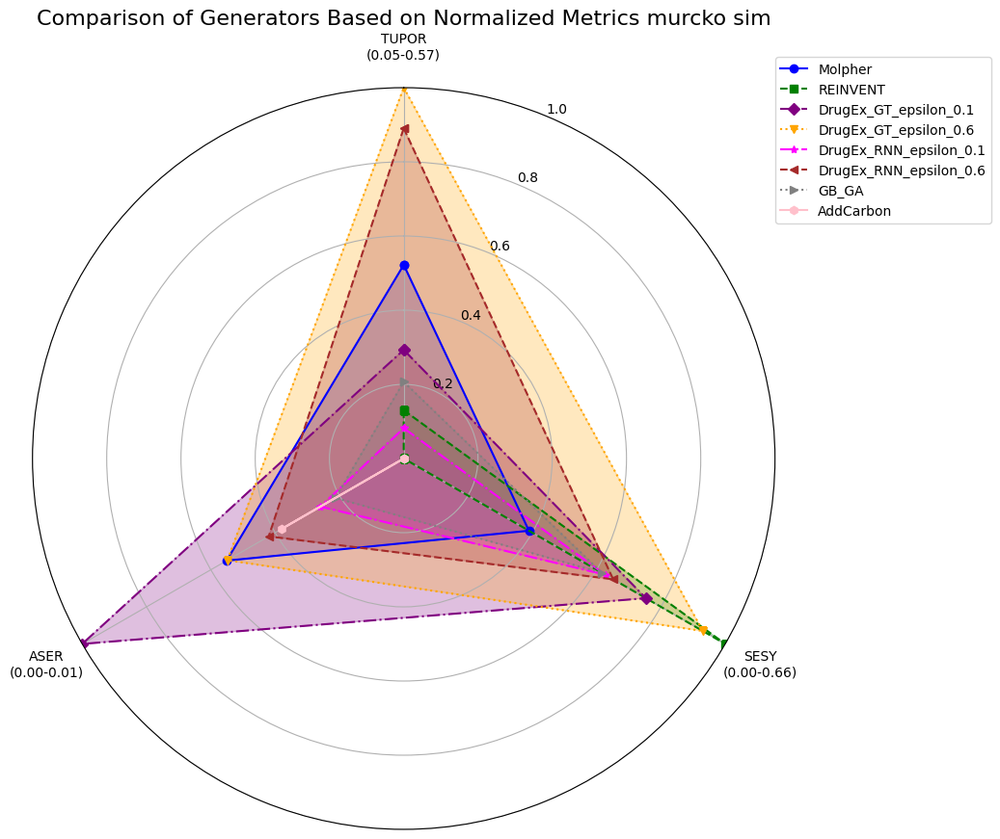

In [168]:
# Loop through different types of data splits ('dis' and 'sim')
for type_split in ['dis', 'sim']:
    # Loop through different scaffold types ('csk' and 'murcko')
    for type_scaffold in ['csk', 'murcko']:
        # Loop through different subset types (e.g., '_10k', '_100k', '_500k', and no subset)
        for subset in ['_10k', '_100k', '_500k', '']:
            
            # Load the dataset based on the current scaffold, data split, and subset
            df = pd.read_csv(f"data/results/Glucocorticoid_receptor/{type_scaffold}_scaffolds/{type_split}/mean_{type_scaffold}_{type_split}{subset}.csv")
            
            # Display the loaded dataframe
            display(df)
            
            # Call the function to normalize the data and plot the radar charts
            # Pass the dataframe, data split type, scaffold type, and subset as arguments
            ra.normalize_and_plot_radar_charts(df, type_split, type_scaffold, subset)

# Trends plot

In [217]:
from scripts import trend_plot as tr
import importlib as imp
imp.reload(tr)


<module 'scripts.trend_plot' from '/home/filv/phd_projects/iga_2023/git_reccal/new/recall_metrics/scripts/trend_plot.py'>

### Vizualization for singal trends to each split, scaffold and subset

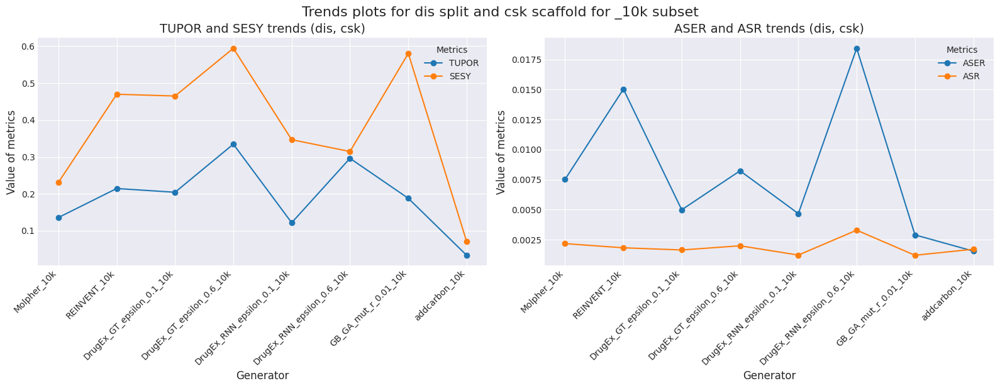

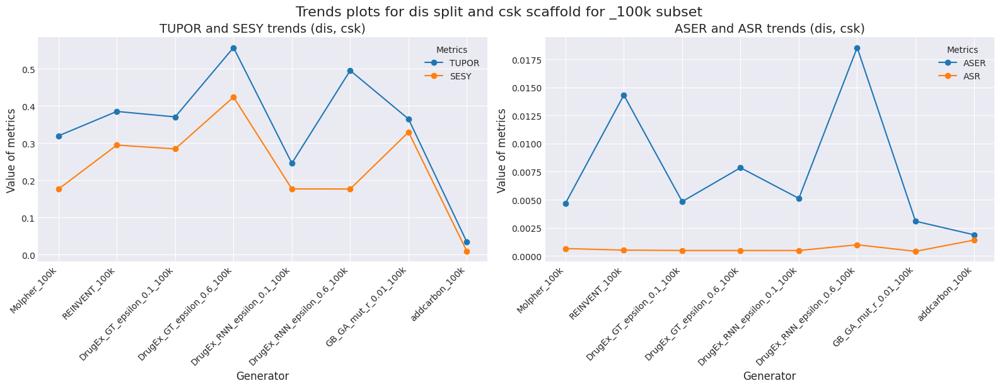

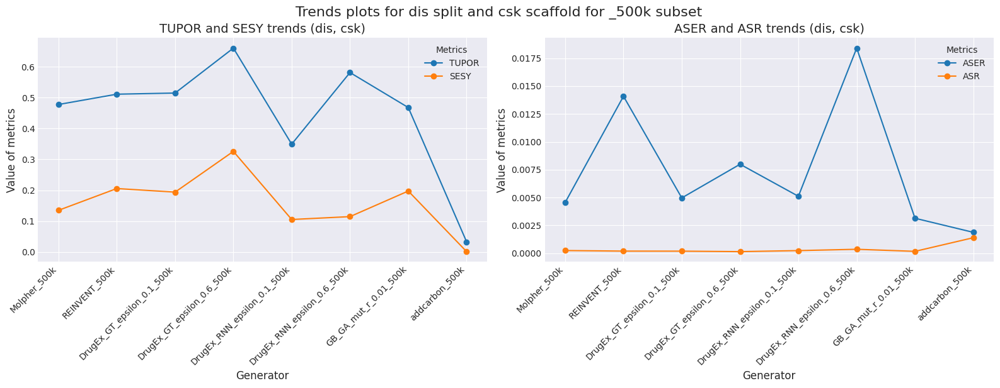

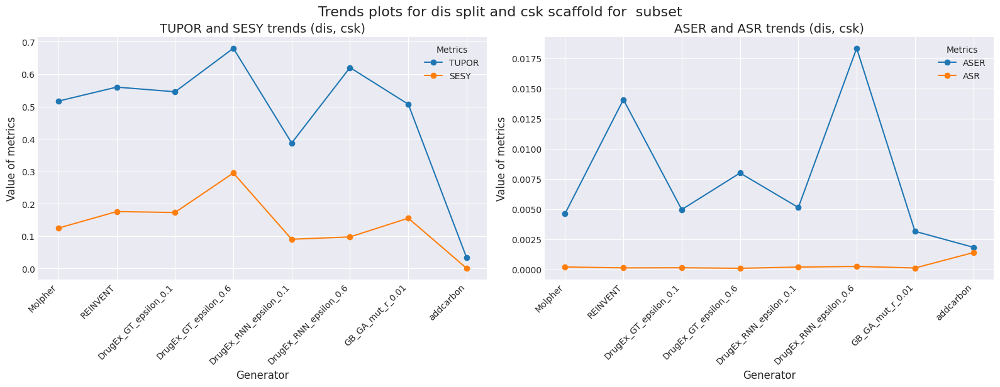

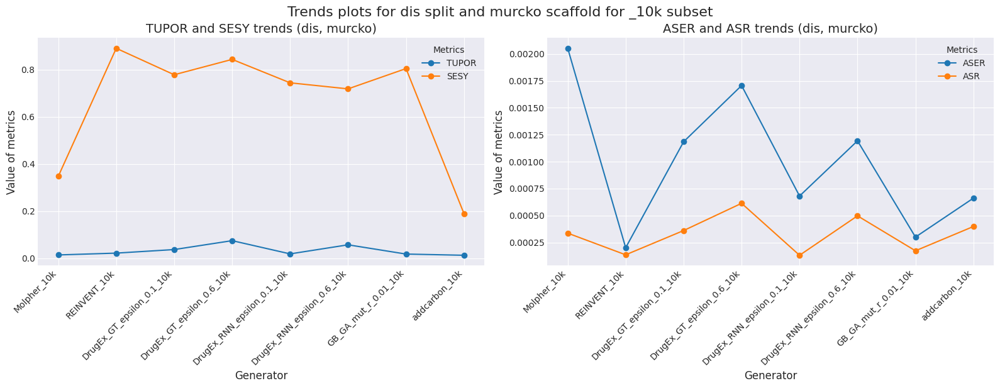

...

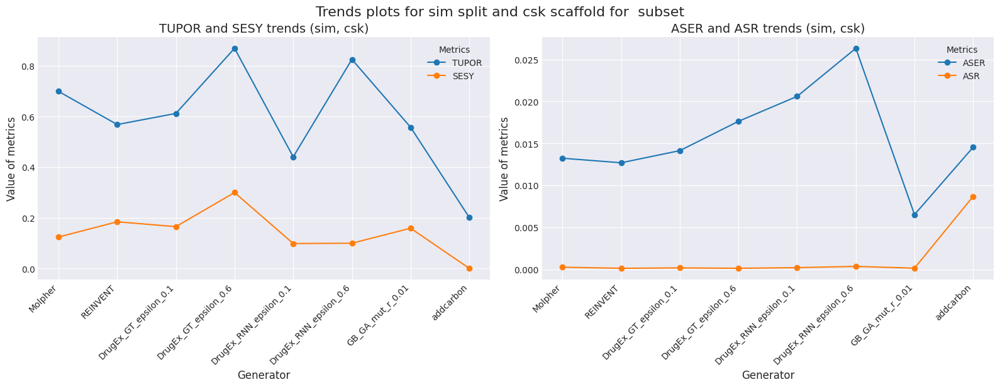

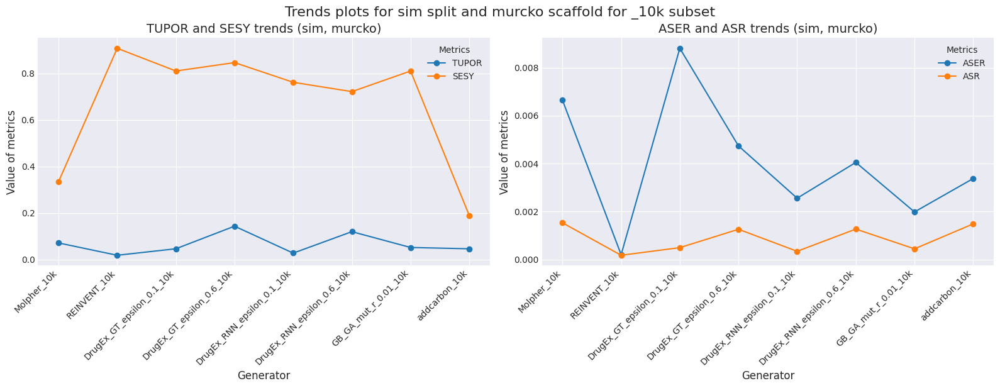

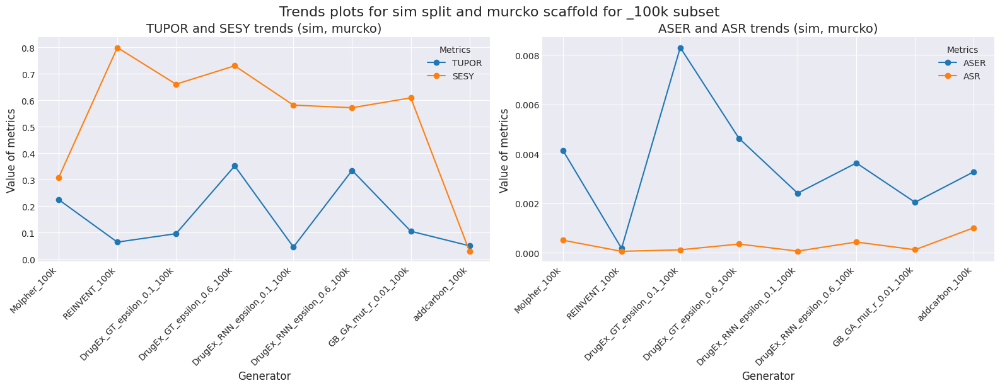

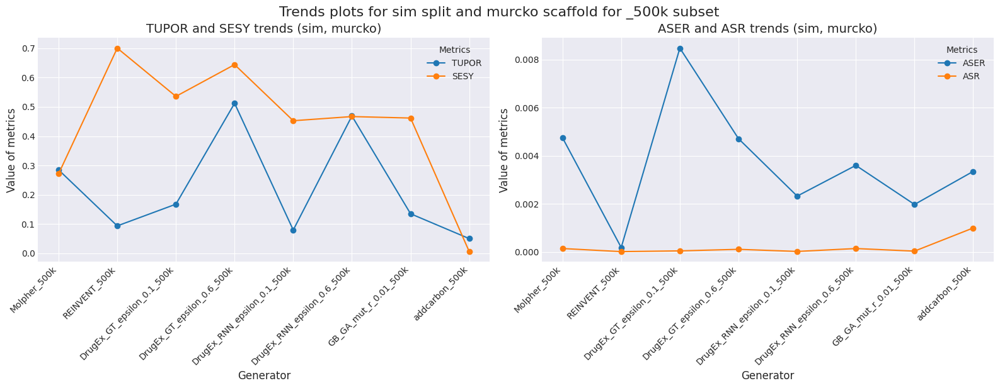

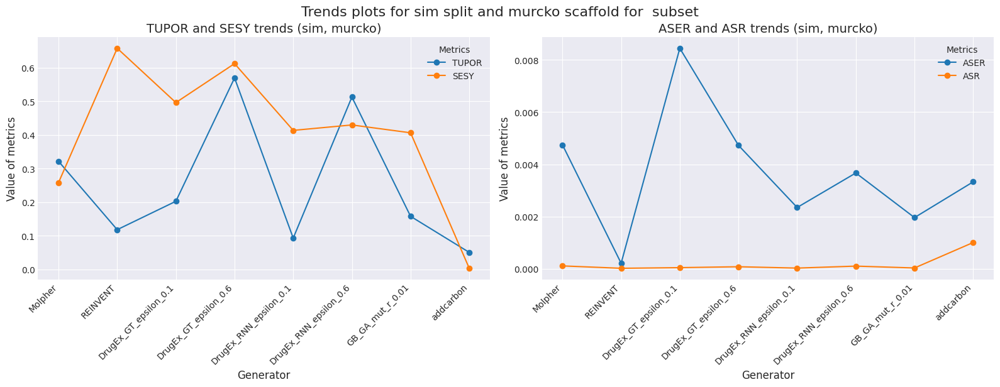

In [201]:
# Loop through different data splits ('dis' and 'sim')
for type_split in ['dis', 'sim']:
    # Loop through different scaffold types ('csk' and 'murcko')
    for type_scaf in ['csk', 'murcko']:
        # Loop through different subsets (empty string, '_1k', '_10k', '_100k', '_500k')
        for subset in [ '_10k', '_100k', '_500k', '']:
            # Load the dataset
            df = pd.read_csv(f'data/results/Glucocorticoid_receptor/{type_scaf}_scaffolds/{type_split}/mean_{type_scaf}_{type_split}{subset}.csv')
            df = df[['name', 'TUPOR', 'SESY', 'ASER', 'ASR']]

            tr.plot_trends(df, type_split, type_scaf, subset)


### Vizualization comparison trends between different subset

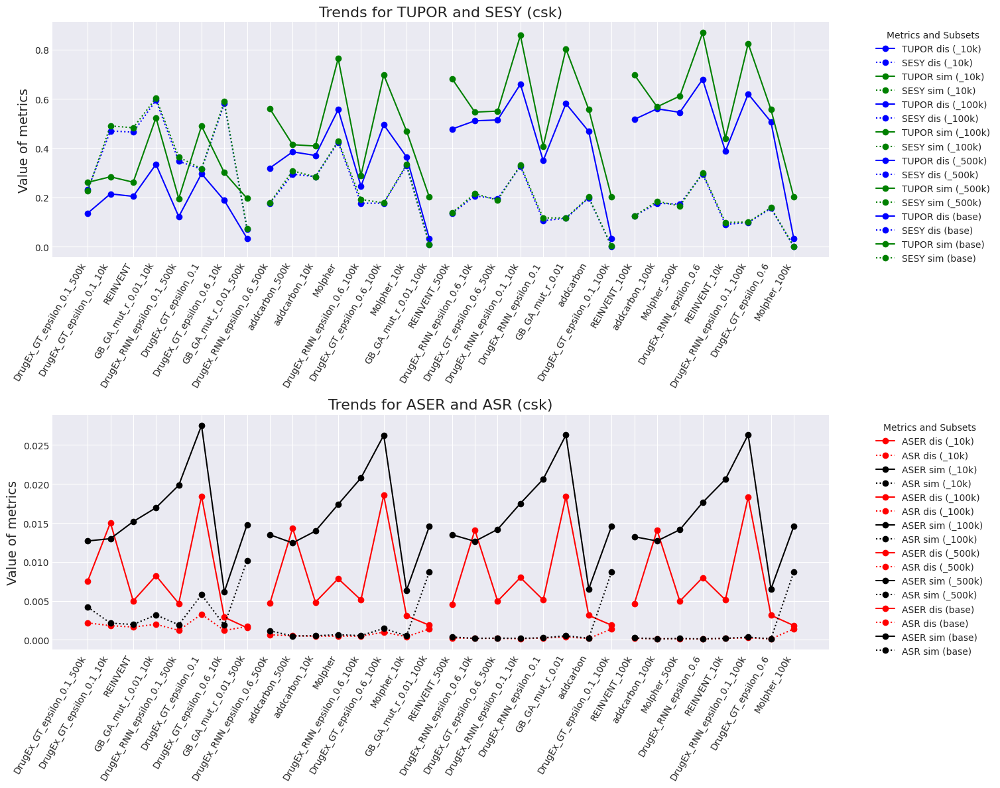

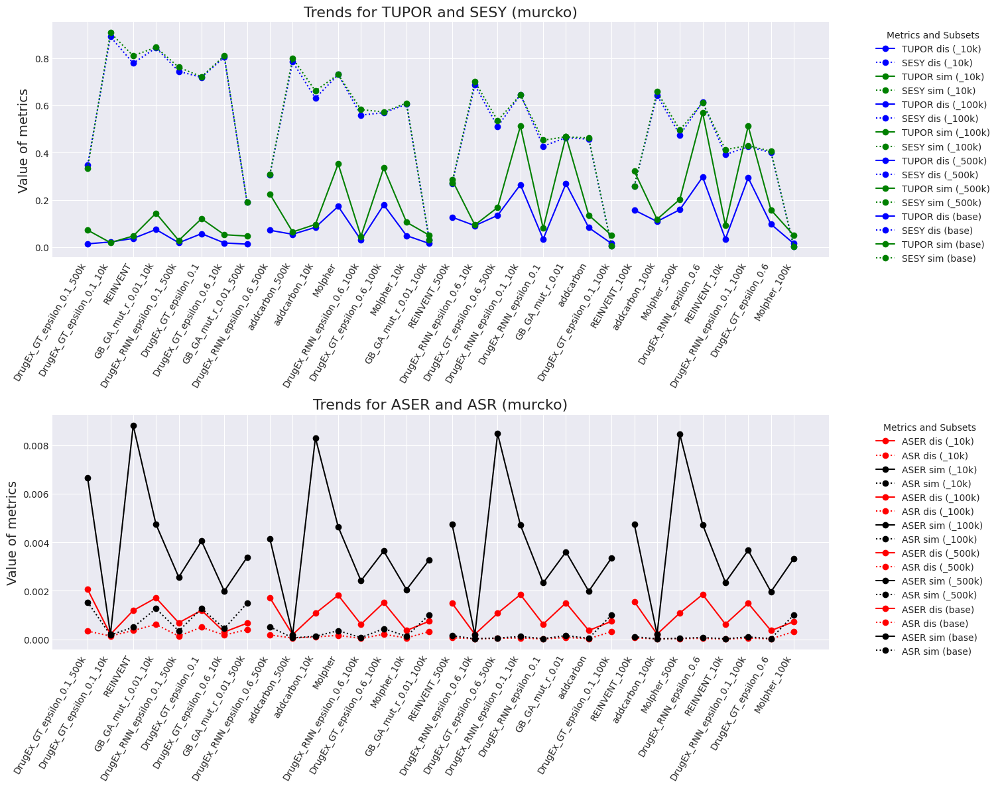

In [211]:
# Define scaffold type and subsets to use

for type_scaf in ['csk', 'murcko']:
    subsets_list = ['_10k', '_100k', '_500k', '']  # Define the subsets you want to analyze

    # Call the function
    tr.plot_subset_trends(type_scaf, subsets_list)

### Vizualization of trends plot between all type of splits and type of scaffolds

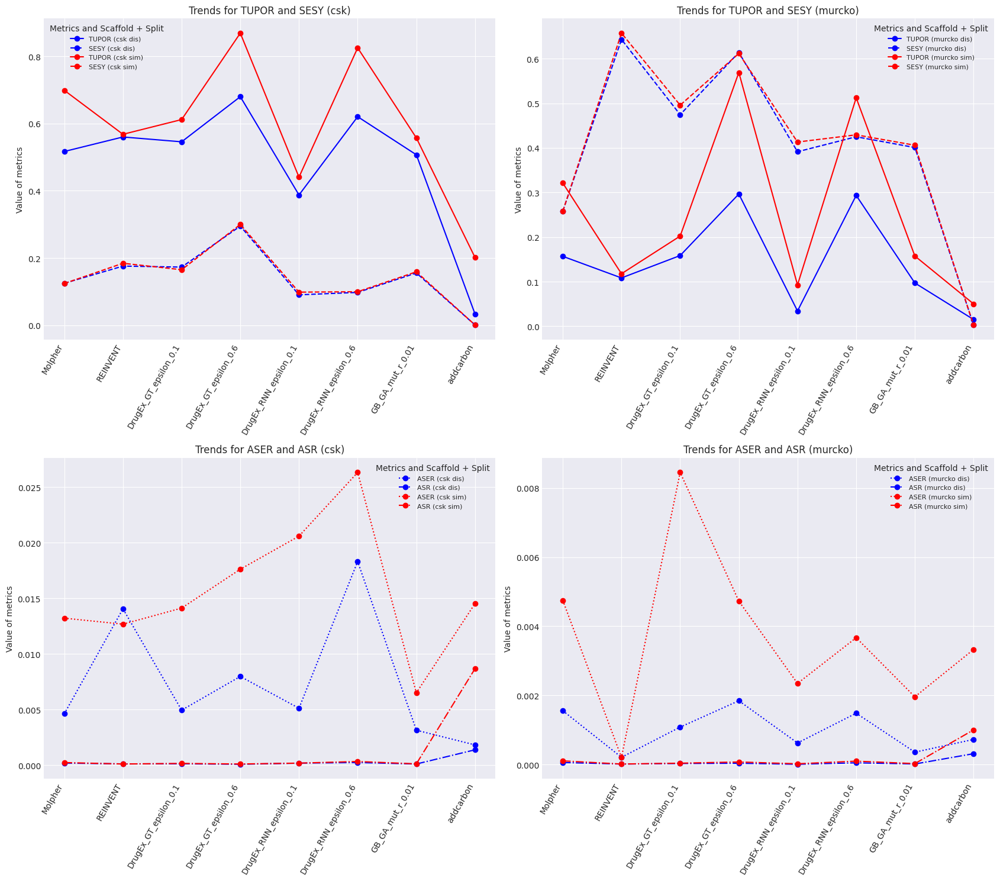

In [216]:
tr.plot_trends_base(scaffolds=['csk', 'murcko'], subsets=['dis', 'sim'])

# t-SNE

In [68]:
from scripts import t_sne_plot as tsne
import importlib as imp
imp.reload(tsne)


<module 'scripts.t_sne_plot' from '/home/filv/phd_projects/iga_2023/git_reccal/new/recall_metrics/scripts/t_sne_plot.py'>

In [71]:
for receptor in ['Glucocorticoid_receptor']:
    for type_cluster in ['dis']:
        for number in [0]:
        
            data_for_tsne = [
                f'input_recall_sets/{receptor}/cIS_{receptor}_{type_cluster}_{number}.csv', 
                f'input_recall_sets/{receptor}/cRS_{receptor}_{type_cluster}_{number}.csv'
                ]
            for gen in ['Molpher', 'REINVENT', 'addcarbon', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6',\
                    'DrugEx_RNN_epsilon_0.1', 'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5']:
                gen_path = f'output_sets/{receptor}/{gen}/cOS_{gen}_{type_cluster}_{number}_one_column.csv'
                data_for_tsne.append(gen_path)

            print(data_for_tsne)
            
            labels_dict = {
                0: 'IS',
                1: 'RS',
                2: 'Molpher',
                3: 'REINVENT',
                4: 'addcarbon',
                5: 'DrugEx_GT_e_0.1',
                6: 'DrugEx_GT_e_0.6',
                7: 'DrugEx_RNN_e_0.1',
                8: 'DrugEx_RNN_e_0.6',
                9: 'GB_GA_mut_r_0.01',
                10: 'GB_GA_mut_r_0.5'
                }

            tsne.process_for_plot_tsne(data_for_tsne, type_cluster, number, receptor, labels_dict)


['input_recall_sets/Glucocorticoid_receptor/cIS_Glucocorticoid_receptor_dis_0.csv', 'input_recall_sets/Glucocorticoid_receptor/cRS_Glucocorticoid_receptor_dis_0.csv', 'output_sets/Glucocorticoid_receptor/Molpher/cOS_Molpher_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/REINVENT/cOS_REINVENT_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/addcarbon/cOS_addcarbon_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_GT_epsilon_0.1/cOS_DrugEx_GT_epsilon_0.1_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_GT_epsilon_0.6/cOS_DrugEx_GT_epsilon_0.6_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_RNN_epsilon_0.1/cOS_DrugEx_RNN_epsilon_0.1_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_RNN_epsilon_0.6/cOS_DrugEx_RNN_epsilon_0.6_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/GB_GA_mut_r_0.01/cOS_GB_GA_mut_r_0.01_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/GB_GA_mut_r_0.5/

[14:35:03] Can't kekulize mol.  Unkekulized atoms: 30 32 33 34 41 42 44
[14:35:03] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 16 20 21 22
[14:35:03] Can't kekulize mol.  Unkekulized atoms: 30 31 32 34 35 36 37 38 40
[14:35:03] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 13
[14:35:04] Can't kekulize mol.  Unkekulized atoms: 5 7 8 10 11 12
[14:35:05] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32 33 38 39 40
[14:35:05] SMILES Parse Error: unclosed ring for input: 'S(=O)(c2ccccc1)cc2C(Oc1ccc2c(cnn2-c2ccncc2)c1)C(C)CC'
[14:35:05] SMILES Parse Error: ring closure 3 duplicates bond between atom 38 and atom 39 for input: 'CC(NC(=O)Cc1csc(C)n1)C(Oc1ccc2c(cnn2-c2ccc(F)cc2F)c1)c1ccc(N2CCC3(C3)CC2)nc1'
[14:35:05] Can't kekulize mol.  Unkekulized atoms: 27 29 30 31 32 33
[14:35:05] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 34 35 45 46 47
[14:35:06] Can't kekulize mol.  Unkekulized atoms: 30 32 33 34 35 36
[14:35:06] Can't kekulize mol.  Unkekulized atoms

Finished processing dataset 0 in 629.62 seconds.


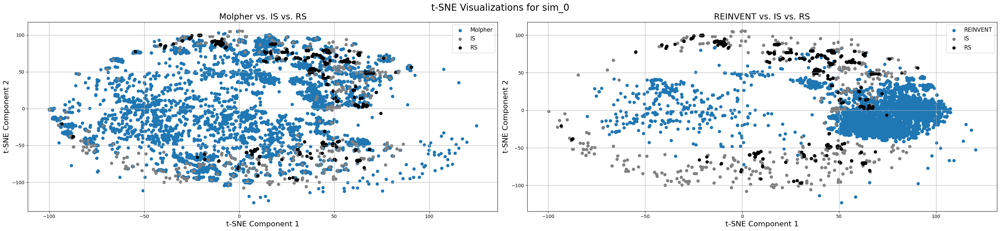

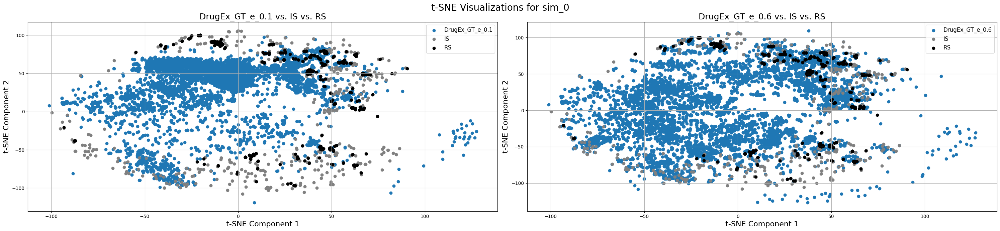

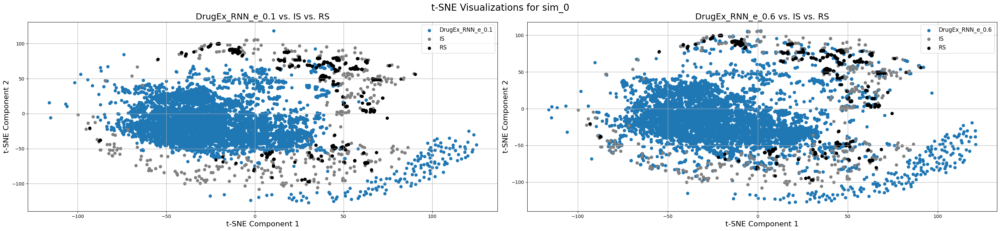

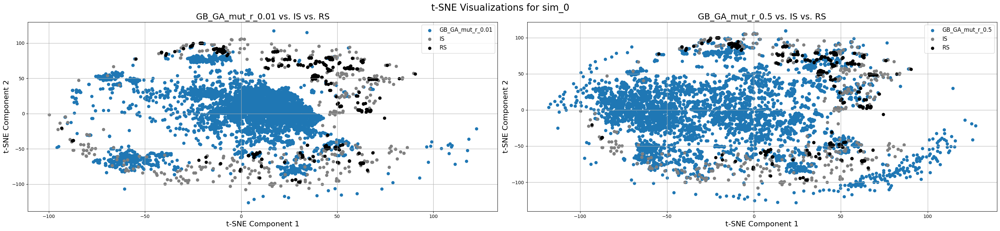

In [74]:
import itertools

for type_cluster in ['sim']:
    for number in [0]:
        receptor = 'Leukocyte_elastase'
            # Define unique label categories for plotting
        '''
        unique_labels = [
        ['Molpher', 'IS', 'RS'],
        ['REINVENT', 'IS', 'RS'],
        ['addcarbon', 'IS', 'RS'],
        ['DrugEx_GT_e_0.1', 'IS', 'RS'],
        ['DrugEx_GT_e_0.6', 'IS', 'RS'],
        ['DrugEx_RNN_e_0.1', 'IS', 'RS'],
        ['DrugEx_RNN_e_0.6', 'IS', 'RS'],
        ['GB_GA_mut_r_0.01', 'IS', 'RS'],
        ['GB_GA_mut_r_0.5', 'IS', 'RS'],
            
        ]'''
        
        generators = ['Molpher', 'REINVENT', 'DrugEx_GT_e_0.1', 'DrugEx_GT_e_0.6',
              'DrugEx_RNN_e_0.1', 'DrugEx_RNN_e_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5']

        # Procházení všech možných dvojic
        for gen1, gen2 in zip(generators[::2], generators[1::2]):
            unique_labels = [
                [gen1, 'IS', 'RS'],
                [gen2, 'IS', 'RS']]
            
            name_save = f'hist_all_{type_cluster}_{number}_{gen1}_{gen2}'
            tsne.plot_tsne_results(type_cluster, number, receptor, unique_labels, name_save)


# NEXT

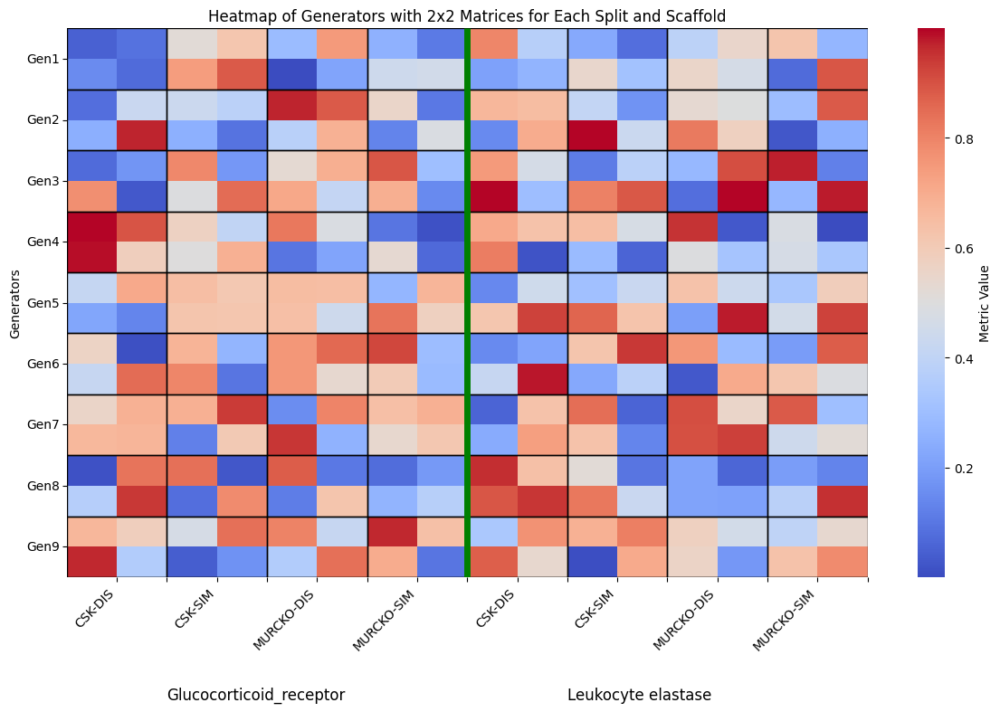

In [132]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Vytvoření vzorových dat
generators = ['Gen1', 'Gen2', 'Gen3', 'Gen4', 'Gen5', 'Gen6', 'Gen7', 'Gen8', 'Gen9']
receptors = ['Receptor1', 'Receptor2']
scaffolds = ['Scaffold1', 'Scaffold2']
splits = ['Dis', 'Sim']
metrics = ['Metric1', 'Metric2', 'Metric3', 'Metric4']

# Představme si, že hodnoty jsou náhodně generované pro ilustraci
data = []
for gen in generators:
    for receptor in receptors:
        for scaffold in scaffolds:
            for split in splits:
                for met in metrics:
                    # Generování náhodných hodnot pro ilustraci
                    value = np.random.rand()  
                    data.append([gen, receptor, scaffold, split, met, value])

# Vytvoření DataFrame
df = pd.DataFrame(data, columns=['Generator', 'Receptor', 'Scaffold', 'Split', 'Metric', 'Value'])

# Předpříprava dat pro heatmapu
heatmap_data = []

# Pro každý generator
for generator in df.Generator.unique():
    df_sub = df[df.Generator == generator]  # Podmnožina pro aktuální generator
    matrix_1 = []
    matrix_2 = []
    
    # Pro každý receptor
    for receptor in df_sub.Receptor.unique():
        df_sub_r = df_sub[df_sub.Receptor == receptor]  # Podmnožina pro aktuální receptor

        # Pro každý scaffold
        for scaffold in df_sub_r.Scaffold.unique():
            df_sub_r_s = df_sub_r[df_sub_r.Scaffold == scaffold]  # Podmnožina pro aktuální scaffold

            # Vytvoření 2x2 matic pro každý split
            for split in splits:
                df_sub_r_s_s = df_sub_r_s[df_sub_r_s.Split == split]

                # Pro každý split vezmeme hodnoty pro 4 metriky
                metric1_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'Metric1']['Value'].values[0]
                metric2_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'Metric2']['Value'].values[0]
                metric3_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'Metric3']['Value'].values[0]
                metric4_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'Metric4']['Value'].values[0]

                # Přidání hodnot do 2x2 matice
                matrix_1.append(metric1_value)
                matrix_1.append(metric2_value)
                matrix_2.append(metric3_value)
                matrix_2.append(metric4_value)

    heatmap_data.append(matrix_1)
    heatmap_data.append(matrix_2)
    

# Převedení heatmap_data na numpy array pro snazší vykreslení
heatmap_data = np.array(heatmap_data)

# Vytvoření figure pro heatmapu
fig, ax = plt.subplots(figsize=(12, 8))

# Vykreslení heatmapy
sns.heatmap(heatmap_data, annot=False, cmap='coolwarm', ax=ax,
            cbar_kws={'label': 'Metric Value'})

# Titulky a popisky
ax.set_title('Heatmap of Generators with 2x2 Matrices for Each Split and Scaffold')
ax.set_ylabel('Generators')

ytick_positions = np.arange(0, len(generators) * 2, 2) + 1  # Posunutí do středu každé dvojice řádků
ax.set_yticks(ytick_positions)  
ax.set_yticklabels(generators, rotation=0, ha="center")  # Zarovnání na střed

# Zvýšení mezer mezi tick-labels
ax.tick_params(axis='y', pad=15)  # Hodnotu můžeš upravit podle potřeby

# Přidání rámečků kolem 2x2 matic
for i in range(len(heatmap_data)):
    for k in [0,2,4,6,8,10,12,14]:
        ax.add_patch(plt.Rectangle((k, i * 2), 2, 2, fill=False, edgecolor='black', lw=1))  # Rámeček pro první 2x2


ax.vlines(x=8, ymin=0, ymax=len(generators) * 2, colors='green', linewidth=5)

custom_xticklabels = ["CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", "", "CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", ""]

# Nastavení popisků osy X
ax.set_xticks(np.arange(len(custom_xticklabels)) + 1)  # Posun na střed sloupců
ax.set_xticklabels(custom_xticklabels, rotation=45, ha="right", fontsize=10)  # Rotace a zarovnání

ax.text(2, 22, "Glucocorticoid_receptor", fontsize=12, color='black')
ax.text(10, 22, "Leukocyte elastase", fontsize=12, color='black')
# Zobrazení heatmapy
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Vytvoření vzorových dat
generators = ['Molpher', 'REINVENT', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6', 'DrugEx_RNN_epsilon_0.1', 'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5', 'addcarbon']
receptors = ['Glucocorticoid_receptor', 'Leukocyte_elastase']
scaffolds = ['csk', 'murcko']
splits = ['dis', 'sim']
metrics = ['TUPOR', 'SESY', 'ASER']

# Představme si, že hodnoty jsou náhodně generované pro ilustraci
data = []
for gen in generators:
    for receptor in receptors:
        for type_scaffold in scaffolds:
            for type_cluster in splits:
                
                df = hv.preprocesing(type_cluster, type_scaffold, generators, receptor)
                
                for met in metrics:
                    # Generování náhodných hodnot pro ilustraci
                    value = df[df.name.str.startswith(gen)][met].iloc[0]
                    data.append([gen, receptor, type_scaffold, type_cluster, met, value])

# Vytvoření DataFrame
df = pd.DataFrame(data, columns=['Generator', 'Receptor', 'Scaffold', 'Split', 'Metric', 'Value'])
df

In [ ]:


# Předpříprava dat pro heatmapu
heatmap_data = []

# Pro každý generator
for generator in df.Generator.unique():
    df_sub = df[df.Generator == generator]  # Podmnožina pro aktuální generator
    matrix_1 = []
    matrix_2 = []
    
    # Pro každý receptor
    for receptor in df_sub.Receptor.unique():
        df_sub_r = df_sub[df_sub.Receptor == receptor]  # Podmnožina pro aktuální receptor

        # Pro každý scaffold
        for scaffold in df_sub_r.Scaffold.unique():
            df_sub_r_s = df_sub_r[df_sub_r.Scaffold == scaffold]  # Podmnožina pro aktuální scaffold

            # Vytvoření 2x2 matic pro každý split
            for split in splits:
                df_sub_r_s_s = df_sub_r_s[df_sub_r_s.Split == split]

                # Pro každý split vezmeme hodnoty pro 4 metriky
                metric1_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'TUPOR']['Value'].values[0]
                metric2_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'SESY']['Value'].values[0]
                metric3_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'ASER']['Value'].values[0]


                # Přidání hodnot do 2x2 matice
                matrix_1.append(metric1_value)
                matrix_1.append(metric2_value)
                matrix_1.append(metric3_value)


    heatmap_data.append(matrix_1)
    heatmap_data.append(matrix_2)
    

# Převedení heatmap_data na numpy array pro snazší vykreslení
heatmap_data = np.array(heatmap_data)

# Vytvoření figure pro heatmapu
fig, ax = plt.subplots(figsize=(12, 10))

# Vykreslení heatmapy
sns.heatmap(heatmap_data, annot=True,fmt=".2f", cmap='coolwarm', ax=ax,
            cbar_kws={'label': 'Metric Value'})

# Titulky a popisky
ax.set_title('Heatmap of Generators with 2x2 Matrices for Each Split and Scaffold')
ax.set_ylabel('Generators')

ytick_positions = np.arange(0, len(generators) * 2, 2) + 1  # Posunutí do středu každé dvojice řádků
ax.set_yticks(ytick_positions)  
ax.set_yticklabels(generators, rotation=0, ha="right")  # Zarovnání na střed

# Zvýšení mezer mezi tick-labels
ax.tick_params(axis='y', pad=15)  # Hodnotu můžeš upravit podle potřeby

# Přidání rámečků kolem 2x2 matic
for i in range(len(heatmap_data)):
    for k in [0,2,4,6,8,10,12,14]:
        ax.add_patch(plt.Rectangle((k, i * 2), 2, 2, fill=False, edgecolor='black', lw=1))  # Rámeček pro první 2x2


ax.vlines(x=8, ymin=0, ymax=len(generators) * 2, colors='green', linewidth=5)

custom_xticklabels = ["CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", "", "CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", ""]

# Nastavení popisků osy X
ax.set_xticks(np.arange(len(custom_xticklabels)) + 1)  # Posun na střed sloupců
ax.set_xticklabels(custom_xticklabels, rotation=45, ha="right", fontsize=10)  # Rotace a zarovnání

ax.text(2, 22, "Glucocorticoid_receptor", fontsize=12, color='black')
ax.text(10, 22, "Leukocyte elastase", fontsize=12, color='black')
# Zobrazení heatmapy
plt.tight_layout()
plt.savefig(f'img/heat_mapa/all_res_norm.svg', format="svg")
plt.show()
